# Dataset analysis

This notebook is used to analyze two-photon data from a single dataset (i.e., mouse, experiment, date) across conditions and trials.

The analysis consists of several successive steps:
1. Pre-processing of raw movie frames
2. Functional segmentation with suite2p
3. Conditioning (i.e. computation of ΔF/F0 and z-score signals)
4. Statistics (data curation, extraction of response metrics & cell classification)
5. Visualization of analysis outputs

---

In [1]:
%load_ext autoreload
%load_ext usnm2p.skip_kernel_extension
%autoreload 2

## Imports

In [2]:
# External packages
import os
import numpy as np
import pandas as pd
import jupyter_slack
import datetime
from scipy.stats import skew

# Internal modules
from usnm2p.logger import logger
from usnm2p.config import default_dataset
from usnm2p.constants import *
from usnm2p.indexers import *
from usnm2p.fileops import *
from usnm2p.parsers import *
from usnm2p.viewers import view_stack, save_stack_to_gif
from usnm2p.filters import KalmanDenoiser
from usnm2p.correctors import LinRegCorrector
from usnm2p.substitutors import StackSubstitutor
from usnm2p.s2putils import *
from usnm2p.postpro import *
from usnm2p.plotters import *
from usnm2p.utils import *
from usnm2p.batchutils import *

## Parameters

### Input dataset and main processing parameters

In [3]:
# Input parameters
analysis_type = DEFAULT_ANALYSIS  # analysis type
mouseline = default_dataset['mouseline']  # mouse line
expdate = default_dataset['expdate']  # experiment date
mouseid = default_dataset['mouseid']  # mouse number
region = default_dataset['region']  # brain region
layer = DEFAULT_LAYER  # cortical layer

# Processing parameters
inspect = True  # whether to inspect data for a randomly chosen run along processing steps
slack_notify = False   # notify start and completion on slack
global_correction = GLOBAL_CORRECTION  # global stack correction method
kalman_gain = KALMAN_GAIN  # gain of Kalman filter
gcamp_key = get_gcamp_key(mouseline)  # GCaMP channel key
neuropil_scaling_coeff = NEUROPIL_SCALING_COEFF  # scaling coefficient for neuropil subtraction
baseline_quantile = BASELINE_QUANTILE  # evaluation quantile for baseline computation
baseline_wquantile = BASELINE_WQUANTILE  # quantile filter window size (s) to compute fluorescence baseline
baseline_wsmoothing = BASELINE_WSMOOTHING  # gaussian filter window size (s) to smooth out fluorescence baseline
trial_aggfunc = TRIAL_AGGFUNC  # trial aggregation function
ykey_classification = YKEY_CLASSIFICATION  # Reference variable for response classification
directional = DIRECTIONAL_DETECTION  # whether to look for directional (i.e. positive only) effect for response detection
um_per_px = None  # Spatial resolution of the microscope FOV (um/pixel)
ykey_plt = Label.ZSCORE  # Reference output variable for plotting
plot_rasters = True  # whether to render raster plots of population activity, or not

### Derived parameters

In [4]:
# Root directory for input data
is_bergamo = mouseline == 'cre_sst' 
if mouseline == 'cre_sst':
    dataroot = get_data_root(kind=f'split/channel1/30.0Hz_5.0Hz_smooth')
    input_root = DataRoot.SPLIT
else:
    input_root = DataRoot.STACKED
    dataroot = get_data_root(kind=input_root)
logger.info(f'input data root: "{dataroot}"')

# Root directory for output figures
figsdir = get_data_root(kind=DataRoot.FIG)  
logger.info(f'output figures directory: "{figsdir}"')

# Initliaze empty figures dictionary
figs = {}

# If global correction is dictionary, extract line-specific method
if isinstance(global_correction, dict):
    global_correction = global_correction[mouseline]

# Construct dataset ID
dataset_id = f'{expdate}_{mouseid}_{region}'
if layer != DEFAULT_LAYER:
    dataset_id = f'{dataset_id}_{layer}'

# Construct processing IDs
prepro_id = []
if global_correction is not None:
    prepro_id.append(global_correction)
if kalman_gain is not None:
    prepro_id.append(f'{kalman_gain}')
prepro_id = '_'.join(prepro_id)
baseline_id = get_baseline_id(baseline_quantile, baseline_wquantile, baseline_wsmoothing)
conditioning_id = f'alpha{neuropil_scaling_coeff}_{baseline_id}'
ykey_classification_str = {Label.DFF: 'dff', Label.ZSCORE: 'zscore'}[ykey_classification]
processing_id = f'agg{trial_aggfunc.__name__}_class{ykey_classification_str}'
if directional:
    processing_id = f'{processing_id}_directional'

# Extract input data directory
datadir = os.path.join(dataroot, analysis_type, mouseline, dataset_id)
if not os.path.exists:
    raise ValueError(f'input data directory "{datadir}" does not exist')
logger.info(f'input data directory: "{datadir}"')

# Extract figures suffix
figs_suffix = f'{mouseline}_{dataset_id}_{prepro_id}_{conditioning_id}_{processing_id}'

# Get time stamp from notebook start
tstamp_start = datetime.datetime.now()
fmts = ['%Y-%m-%d', '%H:%M:%S']
# Log start process
s = f'{dataset_id} notebook started on {tstamp_start.strftime(fmts[0])} at {tstamp_start.strftime(fmts[1])}'
if slack_notify:
    jupyter_slack.notify_self(s)
logger.info(s)

 2024/08/20 13:12:27: input data root: "/gpfs/scratch/lemait01/data/usnm/split/channel1/30.0Hz_5.0Hz_smooth"
 2024/08/20 13:12:27: output figures directory: "/gpfs/scratch/lemait01/data/usnm/figs"
 2024/08/20 13:12:27: input data directory: "/gpfs/scratch/lemait01/data/usnm/split/channel1/30.0Hz_5.0Hz_smooth/main/cre_sst/20200302_mouse130_region1"
 2024/08/20 13:12:27: 20200302_mouse130_region1 notebook started on 2024-08-20 at 13:12:27


### Input summary table figure

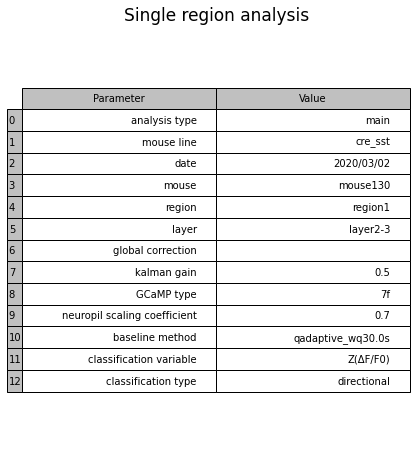

In [5]:
figs['dataset_info'] = plot_table({
    'analysis type': analysis_type,
    'mouse line': mouseline,
    'date': f'{expdate[:4]}/{expdate[4:6]}/{expdate[6:]}',
    'mouse': mouseid,
    'region': region,
    'layer': layer,
    'global correction': global_correction,
    'kalman gain': kalman_gain,
    'GCaMP type': gcamp_key,
    'neuropil scaling coefficient': neuropil_scaling_coeff,
    'baseline method': baseline_id,
    'classification variable': ykey_classification,
    'classification type': f"{'' if directional else 'non '}directional"
    }, title='Single region analysis', aspect=1.5)

### Intermediate data inspection

In [6]:
nROIs_inspect = 3  # number of ROIs to look at for the inspection run (if specified)
stackdict = None  # empty stacks dictionary
runbounds = None  # empty runbounds array
istimframes_stacked = None  # empty stimulus frames array
save_gifs = False  # whether to save gifs of extracted movies or not
qref = 'q0.1'  # reference quantile code for traces baseline extraction 

---
## Pre-processing (frame substitutions, global correction, denoising)

### Gather data files & extract acquisition settings

In [7]:
# Get raw list of TIF files, sorted by run ID
raw_stack_fpaths = get_input_files(datadir, sortby=Label.RUNID)

# Extract number of runs
nruns = len(raw_stack_fpaths)
logger.info(f'number of runs: {nruns}')

# Select random inspected run index, if any 
irun_inspect = random.choice(np.arange(nruns)) if inspect else None  # run index
stacktitle = f'run {irun_inspect}'  # default stack title

# Load acquisition settings
daq_settings = load_acquisition_settings(datadir)
logger.info('acquisition settings:')
display(DictTable(daq_settings))

# Extract spatial and temporal resolution
um_per_px = daq_settings['micronsPerPixel']
fps = 1 / daq_settings['framePeriod']
ntrials_per_run = daq_settings['nTrials']
nframes_per_trial = daq_settings['nFramesPerTrial']
nframes_per_run = ntrials_per_run * nframes_per_trial

# Assemble frame indexer object
tref = get_stim_onset_time(mouseline)
fidx = FrameIndexer.from_time(tref, TPRE, TPOST, 1 / fps, npertrial=nframes_per_trial)

# If outlier runs were found, exclude corresponding folders from analysis 
if 'outliers' in daq_settings and daq_settings['outliers']:
    todiscard = [f for f in raw_stack_fpaths if any([o in f for o in daq_settings['outliers']])]
    discard_str = '\n'.join([f'   - {os.path.basename(f)}' for f in todiscard])
    logger.warning(f'excluding the following files from analysis:\n{discard_str}')
    raw_stack_fpaths = [f for f in raw_stack_fpaths if f not in todiscard]

# Log final files list
raw_stack_fnames = [os.path.basename(f) for f in raw_stack_fpaths]
fnames_str = '\n'.join([f'   - {f}' for f in raw_stack_fnames])
logger.info(f'final files list:\n{fnames_str}')

# Extract index of baseline run, if any
irun_baseline = next((i for i, fp in enumerate(raw_stack_fnames) if '00MP' in os.path.basename(fp)), None)
has_no_baseline_run = irun_baseline is None

 2024/08/20 13:12:31: found 11 TIF files in "/gpfs/scratch/lemait01/data/usnm/split/channel1/30.0Hz_5.0Hz_smooth/main/cre_sst/20200302_mouse130_region1"
 2024/08/20 13:12:31: sorting files by run ID
 2024/08/20 13:12:31: number of runs: 11
 2024/08/20 13:12:31: loading acquisition settings from "/gpfs/scratch/lemait01/data/usnm/split/channel1/30.0Hz_5.0Hz_smooth/main/cre_sst/20200302_mouse130_region1/daq_settings.json"
 2024/08/20 13:12:31: acquisition settings:


Key,Value
SI.acqState,loop
SI.acqsPerLoop,16
SI.extTrigEnable,False
SI.hBeams.beamCalibratedStatus,True
SI.hBeams.directMode,False
SI.hBeams.enablePowerBox,False
SI.hBeams.flybackBlanking,True
SI.hBeams.interlaceDecimation,1
SI.hBeams.interlaceOffset,0
SI.hBeams.lengthConstants,inf


 2024/08/20 13:12:32: final files list:
   - cresst_125frames_100Hz_200ms_5.0Hz_08MPa_50DC_run01.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_06MPa_50DC_run02.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_04MPa_50DC_run03.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_02MPa_50DC_run04.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_01MPa_50DC_run05.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_00MPa_50DC_run06.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_08MPa_05DC_run07.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_08MPa_10DC_run08.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_08MPa_20DC_run09.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_08MPa_30DC_run10.tif
   - cresst_125frames_100Hz_200ms_5.0Hz_08MPa_40DC_run11.tif


### Inspect raw data

 2024/08/20 13:12:33: deriving acoustic intensity information...
 2024/08/20 13:12:44: loading data from cresst_125frames_100Hz_200ms_5.0Hz_04MPa_50DC_run03.tif
 2024/08/20 13:12:44: loaded (2000, 512, 512) int16 stack
 2024/08/20 13:12:44: initializing stack viewer
 2024/08/20 13:12:44: stack size: (2000, 512, 512)
 2024/08/20 13:12:44: adding 16 delimiters


100%|██████████| 2000/2000 [00:05<00:00, 349.88it/s]

 2024/08/20 13:12:50: initializing stack viewer


 2024/08/20 13:12:50: stack size: (2000, 512, 512)
 2024/08/20 13:12:50: computing stack dynamic range across frames 0 - 1999...


100%|██████████| 2000/2000 [00:03<00:00, 526.57it/s]

 2024/08/20 13:12:54: stack dynamic range range: -5 - 176
 2024/08/20 13:12:54: rendering stack view...


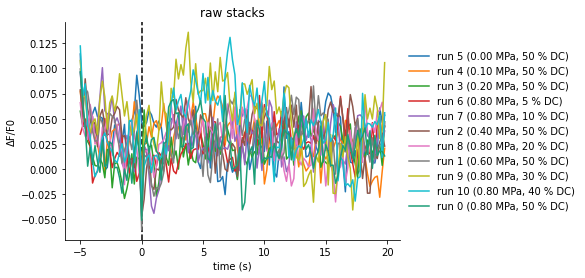

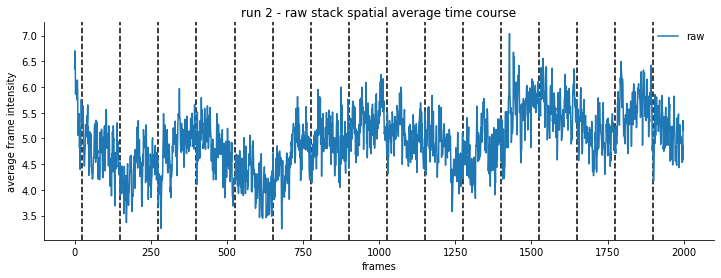

In [8]:
# Extract number of frames for each TIF stack in the input data directory
nframes_per_stack = [load_tif_nframes(stack_fpath) for stack_fpath in raw_stack_fpaths]

# Extract and check consistency of number of frames per run
nframes_per_stack = list(set(nframes_per_stack))
assert len(nframes_per_stack) == 1, f'Differing stack lengths: {nframes_per_stack}'
assert nframes_per_stack[0] == nframes_per_run, f'Stack length ({nframes_per_stack[0]}) inconsistent with number of frames per run in acquisition settings ({nframes_per_run})'

figs['trialavg_stackavg_traces raw'] = plot_trialavg_stackavg_traces(
    raw_stack_fpaths, ntrials_per_run, fidx, title='raw stacks', iref=qref)

# Define indexes of trial start and stimulation frames for a run
i_trialstart_frames_run = np.arange(ntrials_per_run) * nframes_per_trial
i_stim_frames_run = i_trialstart_frames_run + fidx.iref

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:
    # Load stack
    raw_stack = loadtif(raw_stack_fpaths[irun_inspect])

    # Plot time course of the stack spatial average
    figs[f'raw_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse(
        {'raw': raw_stack_fpaths[irun_inspect]},
        ilabels=i_stim_frames_run, title=f'run {irun_inspect} - raw stack')

    # Define stack dictionary
    stackdict = {'raw': raw_stack_fpaths[irun_inspect]}

# Update key for "last processing stage"
lastkey = 'raw'

# View stack, if run index is defined
view_stack(
    stackdict, title=stacktitle, ilabels={'STIM': i_stim_frames_run}, fps=fps, rel_vbounds=(0, 0.3))

### Substitute problematic frames

- stimulation frames are highly polluted by stimulation-evoked noise -> we substitute them by their preceding frames.
- initial frames of each sonication trial also seem problematic -> they are substituted by their following frames

 2024/08/20 13:12:56: all output files already exist -> skipping
 2024/08/20 13:12:56: deriving acoustic intensity information...
 2024/08/20 13:13:07: loading data from cresst_125frames_100Hz_200ms_5.0Hz_04MPa_50DC_run03.tif
 2024/08/20 13:13:07: loaded (2000, 512, 512) int16 stack
 2024/08/20 13:13:07: initializing stack viewer
 2024/08/20 13:13:07: stack size: (2000, 512, 512)
 2024/08/20 13:13:07: adding 16 delimiters


100%|██████████| 2000/2000 [00:05<00:00, 351.96it/s]

 2024/08/20 13:13:18: initializing stack viewer
 2024/08/20 13:13:18: stack size: (2000, 512, 512)
 2024/08/20 13:13:18: computing stack dynamic range across frames 0 - 1999...



100%|██████████| 2000/2000 [00:03<00:00, 527.87it/s]

 2024/08/20 13:13:22: stack dynamic range range: -5 - 176
 2024/08/20 13:13:22: computing stack dynamic range across frames 0 - 1999...



100%|██████████| 2000/2000 [00:03<00:00, 547.18it/s]

 2024/08/20 13:13:25: stack dynamic range range: -5 - 176
 2024/08/20 13:13:25: rendering stack view...


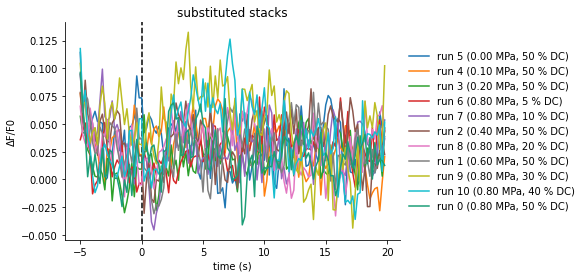

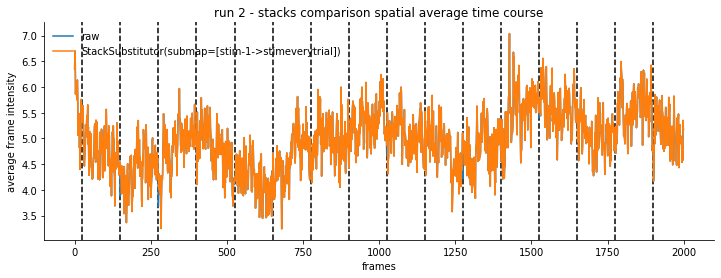

In [9]:
# Define substitutor object
submap = get_submap(mouseline)
ss = StackSubstitutor(submap, fidx=fidx) if submap is not None else NoProcessor()

# Substitute problematic frames in every TIF stack and save outputs in specific directory 
substituted_stack_fpaths = process_and_save(
    ss, raw_stack_fpaths, input_root, overwrite=False)

# If substitutor is StackSubstitutor
if isinstance(ss, StackSubstitutor):
    # Update input root code
    input_root = ss.rootcode

    # Plot trial-averaged and stack-averaged traces for substituted stacks
    figs['trialavg_stackavg_traces substituted'] = plot_trialavg_stackavg_traces(
        substituted_stack_fpaths, ntrials_per_run, fidx, title='substituted stacks', iref=qref)

    # If run index is defined, inspect stack metrics for that particular run
    if irun_inspect is not None:
        # Load interpolated stack for the same run
        subsituted_stack = loadtif(substituted_stack_fpaths[irun_inspect])

        # Plot comparative time course of the stacks spatial average
        figs[f'interp_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse({
            lastkey: raw_stack_fpaths[irun_inspect],
            ss: substituted_stack_fpaths[irun_inspect]
            }, ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')

        # Update stacks dictionary
        stackdict = {
            lastkey: raw_stack_fpaths[irun_inspect],
            ss: substituted_stack_fpaths[irun_inspect]
        }

    # Update key for "last processing stage"
    lastkey = ss

# Otherwise, set stack dict to None
else:
    stackdict = None

# Visualize raw and substituted stacks side-by-side, if run index is defined
view_stack(
    stackdict, title=stacktitle, ilabels={'STIM': i_stim_frames_run}, fps=fps, rel_vbounds=(0, 0.3))

### Global stack correction

Goal: remove global artifacts from the stack (e.g. slow drifts in the baseline fluorescence, low-frequency fluctuations, etc.)

In [10]:
# Define stack corrector object
if global_correction is not None:
    lrc = LinRegCorrector.from_string(global_correction)  # real corrector object
else:
    lrc = NoProcessor()  # dummy corrector object

# Correct every TIF stack and save outputs in specific directory
corrected_stack_fpaths = process_and_save(
    lrc, substituted_stack_fpaths, input_root, overwrite=False)

# If corrector is LinRegCorrector
if isinstance(lrc, LinRegCorrector):
    # Update input root code
    input_root = lrc.rootcode

    # Plot trial-averaged and stack-averaged traces for corrected stacks
    figs['trialavg_stackavg_traces corrected'] = plot_trialavg_stackavg_traces(
        corrected_stack_fpaths, ntrials_per_run, fidx, title='corrected stacks', iref=qref)

    # If run index is defined, inspect stack metrics for that particular run
    if irun_inspect is not None:
        # Plot comparative time course of the stacks spatial average
        figs[f'corrected_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse({
            lastkey: substituted_stack_fpaths[irun_inspect],
            lrc: corrected_stack_fpaths[irun_inspect]
            }, ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')

        # Update stacks dictionary
        stackdict = {
            lastkey: substituted_stack_fpaths[irun_inspect],
            lrc: corrected_stack_fpaths[irun_inspect]}
        
    # Update key for "last processing stage"
    lastkey = lrc

# Otherwise, set stack dict to None
else:
    stackdict = None

# Visualize substituted and denoised stacks side-by-side, if run index is defined
view_stack(
    stackdict, 
    title=stacktitle, 
    ilabels={'STIM': i_stim_frames_run}, 
    fps=fps,
    rel_vbounds=(0, 0.3), 
    norm='all',
)

 2024/08/20 13:13:28: all output files already exist -> skipping


### Denoising

The aim of this step is to remove the Speckle noise present in raw microscope aqcuisition frames. To this end, we use a modified implementation of the Kalman filter. The main parameter influencing the outcome of this processing step is the *specified filter gain* (`G`). From collective experience and comparative visual inspections, it seems that values around 0.5 work well when using GCaMP6s as a fluorescence reporter.

Moreover, our modified Kalman implementation offers the advantages that
- wrong guesses of the initial variance will not prevent noise estimation but merely delay the fitting process.
- an initial baseline padding is used to absorb this fitting process.
Hence, we will fix here default parameters for the variance (`V = 0.05`) and padding length (`n = 10`).

 2024/08/20 13:13:30: all output files already exist -> skipping
 2024/08/20 13:13:30: deriving acoustic intensity information...
 2024/08/20 13:13:40: initializing stack viewer
 2024/08/20 13:13:40: stack size: (2000, 512, 512)
 2024/08/20 13:13:40: adding 16 delimiters


100%|██████████| 2000/2000 [00:05<00:00, 359.45it/s]

 2024/08/20 13:13:51: initializing stack viewer
 2024/08/20 13:13:51: stack size: (2000, 512, 512)
 2024/08/20 13:13:51: computing stack dynamic range across frames 0 - 1999...



100%|██████████| 2000/2000 [00:03<00:00, 514.90it/s]

 2024/08/20 13:13:55: stack dynamic range range: -5 - 176
 2024/08/20 13:13:55: computing stack dynamic range across frames 0 - 1999...



100%|██████████| 2000/2000 [00:03<00:00, 540.59it/s]

 2024/08/20 13:13:59: stack dynamic range range: -3 - 132
 2024/08/20 13:13:59: rendering stack view...


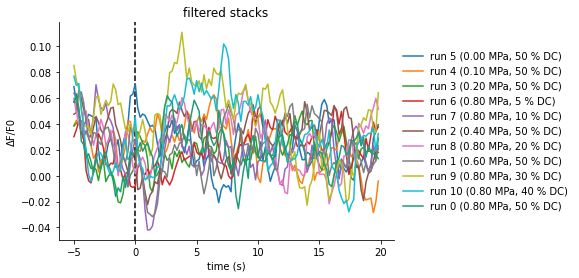

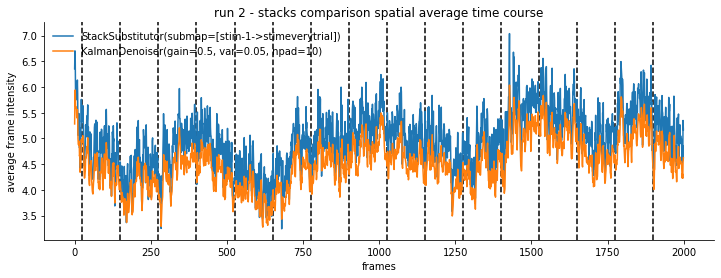

In [11]:
# Define Kalman filter
if kalman_gain is not None and kalman_gain > 0:
    kd = KalmanDenoiser(G=kalman_gain, V=0.05, npad=10)  # real filter object
else:
    kd = NoProcessor()  # dummy filter object used to work on raw stacks

# Denoise every TIF stack and save outputs in specific directory
filtered_stack_fpaths = process_and_save(kd, corrected_stack_fpaths, input_root, overwrite=False)

# If denoiser is KalmanDenoiser
if isinstance(kd, KalmanDenoiser):
    # Update input root code
    input_root = kd.rootcode

    # Plot trial-averaged and stack-averaged traces for filtered stacks
    figs['trialavg_stackavg_traces filtered'] = plot_trialavg_stackavg_traces(
        filtered_stack_fpaths, ntrials_per_run, fidx, title='filtered stacks', iref=qref)

    # If run index is defined, inspect stack metrics for that particular run
    if irun_inspect is not None:
        # Plot comparative time course of the stacks spatial average
        figs[f'filtered_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse({
            lastkey: corrected_stack_fpaths[irun_inspect],
            kd: filtered_stack_fpaths[irun_inspect]
            }, ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')

        # Update stacks dictionary
        stackdict = {
            lrc: corrected_stack_fpaths[irun_inspect],
            kd: filtered_stack_fpaths[irun_inspect]}
        
    # Update key for "last processing stage"
    lastkey = kd

# Otherwise, set stack dict to None
else:
    stackdict = None

# Visualize substituted and denoised stacks side-by-side, if run index is defined
view_stack(
    stackdict, title=stacktitle, ilabels={'STIM': i_stim_frames_run}, fps=fps, rel_vbounds=(0, 0.3))

---

## Functional segmentation (suite2p)

The denoised TIF stacks are fed into the *suite2p* pipeline to extract cell-specific fluorescence timeseries. This consists of several sub-steps:
- conversion from TIF to binary data "movie"
- motion correction using (rigid & non-rigid) movie registration
- movie projection at various spatial scales to compute a "correlation map"
- iterative peak detection on correlation map, and extension around these peaks to determine regions of interest (ROIs)
- extraction of associated "neuropil" areas around each ROI (contaning contaminating signals originating from axons & dendrites located outside of the plane of interest but in the acquisition volume)
- ROI classification into cell (i.e. soma) and non-cell (e.g. axons, dendrites...) ROIs based on extracted features of ROI activity (skewness, variance, correlation to surrounding pixels) and anatomy (area, aspect ratio), using a naive Bayes classifier trained on cortical data
- extraction of ROI's calcium fluorescence timecourse and optional spike deconvolution.

**Important**: if multiple stacked TIF files are provided as input, suite2p will **stack them sequentially prior to processing**. Therefore, **all stacked TIF files in the input folder must correspond to the same brain region**.

Upon completion, suite2p produces the following output files:
- `F.npy`: array of fluorescence traces (ROIs by timepoints)
- `Fneu.npy`: array of neuropil fluorescence traces (ROIs by timepoints)
- `spks.npy`: array of deconvolved traces (ROIs by timepoints)
- `stat.npy`: array of statistics computed for each cell (ROIs by 1)
- `ops.npy`: options and intermediate outputs (identical to the output of the run_s2p function)
- `iscell.npy`: specifies whether an ROI is a cell, first column is 0/1, and second column is probability that the ROI is a cell based on the default classifier
- `data.bin` (optional): registered image stack in binary format format.

These files are saved in a folder renamed after the suite2p execution parameters.

 2024/08/20 13:14:01: parsed frame rate = 5.0 fps
 2024/08/20 13:14:01: Suite2p input directory:
/gpfs/scratch/lemait01/data/usnm/filtered/kd_G0.5_V0.05_npad10/submap_stim-1->stimeverytrial/channel1/30.0Hz_5.0Hz_smooth/main/cre_sst/20200302_mouse130_region1
 2024/08/20 13:14:01: running suite2p 0.10.2 with the following options:
{'denoise': False,
 'do_registration': 1,
 'fs': 5.0,
 'nonrigid': True,
 'reg_tif': True,
 'tau': 0.7}
 2024/08/20 13:14:01: suite2p code "suite2p_fs_5.0_reg_tif_tau_0.7"
 2024/08/20 13:14:01: found all suite2p output files in "/gpfs/scratch/lemait01/data/usnm/segmented/suite2p_fs_5.0_reg_tif_tau_0.7/kd_G0.5_V0.05_npad10/submap_stim-1->stimeverytrial/channel1/30.0Hz_5.0Hz_smooth/main/cre_sst/20200302_mouse130_region1"
 2024/08/20 13:14:01: run options match 100% -> ignoring
 2024/08/20 13:14:01: empty data path -> no run
 2024/08/20 13:14:01: extracted data contains 97 ROIs
 2024/08/20 13:14:01: extracting background pixels mask
 2024/08/20 13:14:01: found 246

100%|██████████| 2000/2000 [00:04<00:00, 416.83it/s]

 2024/08/20 13:14:47: initializing stack viewer
 2024/08/20 13:14:47: stack size: (22000, 512, 512)
 2024/08/20 13:14:47: frame frange: [4000, 5999]



100%|██████████| 2000/2000 [00:06<00:00, 327.42it/s]

 2024/08/20 13:14:53: plotting suite2p registration offsets...


 2024/08/20 13:14:54: plotting suite2p registered images...
 2024/08/20 13:14:54: plotting suite2p sparse projection maps...
 2024/08/20 13:14:54: plotting suite2p identified ROIs...
 2024/08/20 13:14:56: initializing stack viewer
 2024/08/20 13:14:56: stack size: (22000, 512, 512)
 2024/08/20 13:14:56: frame frange: [4000, 5999]
 2024/08/20 13:14:56: computing stack dynamic range across frames 4000 - 5999...


100%|██████████| 2000/2000 [00:05<00:00, 371.95it/s]

 2024/08/20 13:15:01: stack dynamic range range: -9.0 - 125.0
 2024/08/20 13:15:01: rendering stack view...


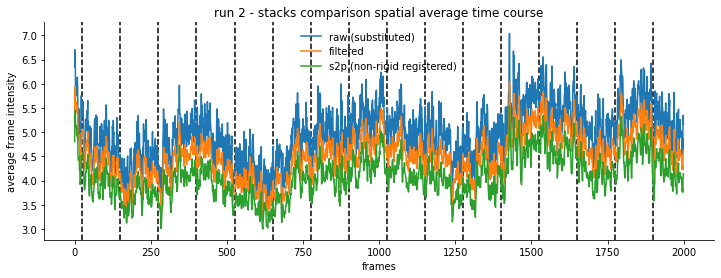

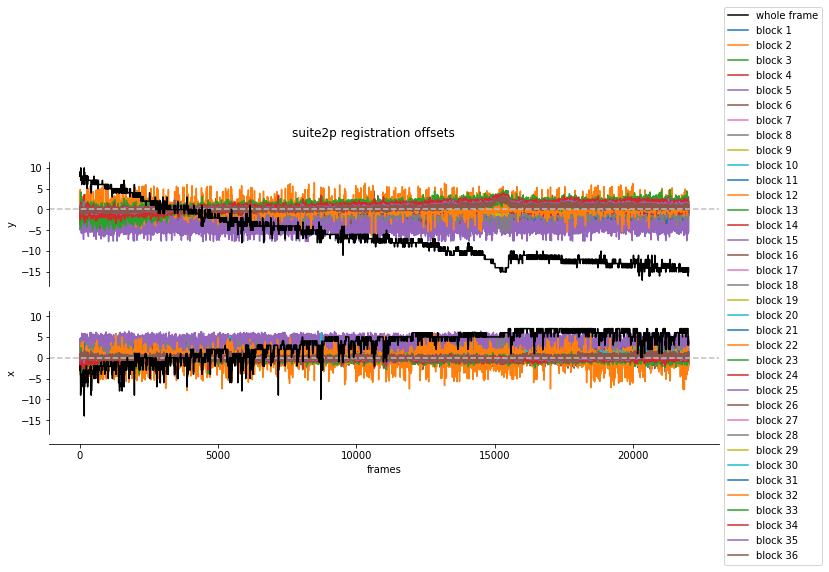

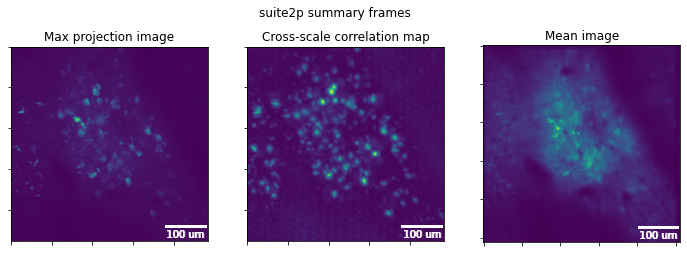

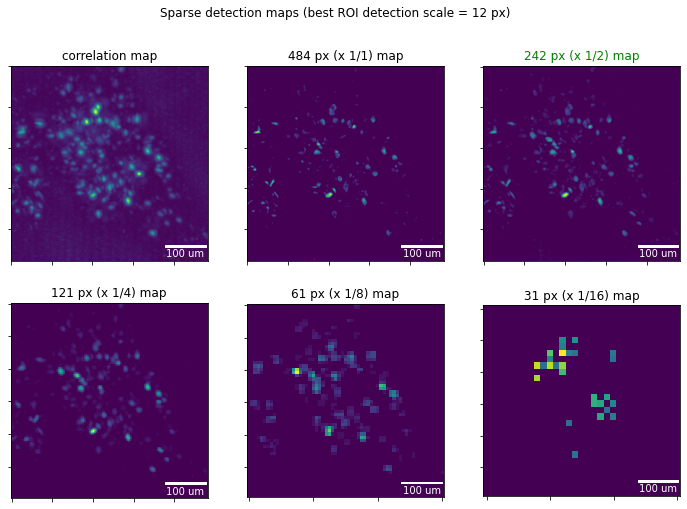

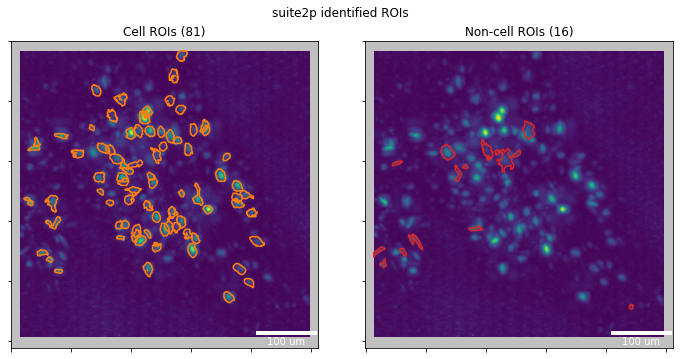

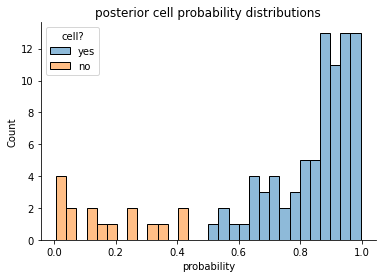

In [12]:
# Determine input filepaths and names (filtered stacks)
s2p_input_fpaths = filtered_stack_fpaths
s2p_input_dtype = get_tif_dtype(filtered_stack_fpaths[0])
s2p_conv_factor = 2 if s2p_input_dtype == np.uint16 else 1
s2p_input_fnames = [os.path.basename(f) for f in s2p_input_fpaths]

# Parse input files into info table and extract FPS from it
input_info_table = get_info_table(s2p_input_fpaths, ntrials_per_run=ntrials_per_run)
fps = get_singleton(input_info_table, Label.FPS)
logger.info(f'parsed frame rate = {fps} fps')

# Get the parent folder of input filepaths
s2p_input_dirs = list(set(os.path.split(x)[0] for x in s2p_input_fpaths))
assert len(s2p_input_dirs) == 1, 'More than 1 suite2p input directory'
s2p_input_dir = s2p_input_dirs[0]
logger.info(f'Suite2p input directory:\n{s2p_input_dir}')

# Define suite2p custom options
ops = {
    'tau': GCAMP_DECAY_TAU[gcamp_key],  # timescale of the sensor
    'fs': fps,  # sampling rate (per plane)
    'do_registration': 1,  # whether or not to perform image registration,
    'reg_tif': True,  # whether or not to write the registered binary to tiff files
    'nonrigid': True,  # whether or not to perform non-rigid registration, which splits the field of view into blocks and computes registration offsets in each block separately.
    'denoise': False,  # perform PCA denoising of the registered stack prior to ROI detection
}

# Run suite2p with custom options
seg_input_key = input_root if isinstance(kd, NoProcessor) else 'filtered'
s2p_outdir = run_s2p_and_rename(
    ops=ops, db={'data_path': [s2p_input_dir], 'tiff_list': s2p_input_fnames},
    overwrite='?', input_key=seg_input_key)

# Load suite2p output data and extract options dictionary
s2p_data = get_suite2p_data(s2p_outdir, withops=True, s2p_outdir=s2p_outdir)
s2p_ops = s2p_data.pop('ops')
outstack_label = get_s2p_stack_label(s2p_ops)

# Extract background mask and associated mean fluorescence time course
background_mask, background_F = extract_s2p_background(s2p_ops, s2p_data['stat'])

# Check that number of runs and number of frames per run extracted from suite2p output
# are consistent with suite2p inputs
nruns_out = len(s2p_ops['filelist'])
assert nruns == nruns_out, f'inconsistent number of runs between input and output: {nruns} and {nruns_out}'
del nruns_out
nframes_per_run_out = list(set(s2p_ops['frames_per_file']))
assert len(nframes_per_run_out) == 1,  'inconsistent number of frames for each run in output'
nframes_per_run_out = nframes_per_run_out[0]
assert nframes_per_run == nframes_per_run_out, f'inconsistent number of frames per run between input and output: {nframes_per_run} and {nframes_per_run_out}'
del nframes_per_run_out

# Generate info table from suite2p output
output_info_table = get_info_table(s2p_ops['filelist'], ntrials_per_run=ntrials_per_run)

# Check that file order is consistent between suite2p inputs
output_to_input_mapping = (output_info_table['code'].values[:, None] == input_info_table['code'].values).argmax(axis=0)
if np.any(output_to_input_mapping != np.arange(len(output_to_input_mapping))):
    raise ValueError('inconsistent run order in inputs and outputs')
del output_info_table['code']

# Get index of zero pressure run
try:
    irun_P0 = output_info_table[output_info_table[Label.P] == 0.].index[0]
    logger.info(f'zero pressure run index = {irun_P0}')
except IndexError as err:
    irun_P0 = None
    logger.warning('no zero-pressure run found')

# Log info table
logger.info(
    f'output info table corresponding to suite2p processing order:\n{output_info_table}')

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:

    # View output stack
    istimframes_stacked = np.tile(i_stim_frames_run, (nruns, 1))
    for i in range(nruns):
        istimframes_stacked[i] += i * nframes_per_run
    istimframes_stacked = istimframes_stacked.flatten()
    runbounds = [nframes_per_run * irun_inspect, nframes_per_run * (irun_inspect + 1) - 1]
    stackdict = s2p_ops
    stacktitle = f'{outstack_label} stack (run {irun_inspect})'
    registered_stack = get_s2p_stack(s2p_ops, bounds=runbounds, factor=s2p_conv_factor)

    # Plot comparative time course of the stacks spatial average
    # That is a good opportunity to check that our mapping of input stacks
    # to suite2p output stacks is correct.
    fig = plot_stack_timecourse({
        'raw (substituted)': substituted_stack_fpaths[irun_inspect],
        'filtered': filtered_stack_fpaths[irun_inspect]
        },
        ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')
    figs[f'registered_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse(
        s2p_ops, title=outstack_label, fbounds=runbounds, ax=fig.axes[0])

# Plot registration offsets over time
figs['registered_offsets'] = plot_suite2p_registration_offsets(
    s2p_ops, title='suite2p registration offsets')

# Plot suite2p summary images
figs['registered_images'] = plot_suite2p_registration_images(
    s2p_ops, title='suite2p summary frames', um_per_px=um_per_px)

# Plot sparse detection maps
figs['sparse_maps'] = plot_suite2p_sparse_maps(
    s2p_ops, um_per_px=um_per_px)

# Plot detected ROIs on FOV
figs['identified_ROIs'] = plot_suite2p_ROIs(
    s2p_data, s2p_ops, title='suite2p identified ROIs',
    um_per_px=um_per_px, mode='contour')

# Plot posterior cell probabilities for all ROIs 
figs['ROI_prob_dists'] = plot_suite2p_ROI_probs(s2p_data['iscell'])

# Visualize registered stack, if run index is defined
view_stack(
    stackdict, 
    fbounds=runbounds,
    title=stacktitle, 
    ilabels=None if irun_inspect is None else {'STIM': i_stim_frames_run + nframes_per_run * irun_inspect}, 
    fps=fps, 
    rel_vbounds=(0, 0.3))

---

## Signal conditioning

The main aim of this step is to convert the raw fluorescence timeseries of each ROI (extracted from the suite2p output files) to normalized fluorescence timeseries. This is carried out in successive sub-steps:
- extraction of cell and associated neuropil fluorescence traces
- subtraction of neuropil background with an appropriate coeefficient (currently 0.7) to obtain a corrected fluorescence timecourse (F) of each ROI
- baseline (F0) computation and baseline correction of neuropil-corrected fluorescence traces (on a run-specific basis)
- baseline normalization to obtain relative change fluorescence traces ΔF/F0 (also run-specific)
- noise level and variation range estimation and subsequent noise-normalization of relative change fluorescence traces into z-score traces.

Upon completion, a "conditioned" file is created named after the dataset (date, mouse, region) ID, in which the following outputs are saved:
- `info_table`: summary table of the parameters pertaining to each run
- `ROI_masks`: table of the pixel masks of each selected ROI in the reference frame.
- `timeseries`: dff and z-score timeseries (along with their ROI, run, trial and frame index information)

### Load conditioned data if available

In [13]:
s2p_outbase, s2p_basedir = os.path.split(s2p_outdir)
conditioning_dir = get_output_equivalent(
    s2p_outbase, DataRoot.SEGMENTED, f'{DataRoot.CONDITIONED}/{conditioning_id}')
conditioned_fpath = os.path.join(conditioning_dir, f'{s2p_basedir}.h5')
try:
    logger.info('loading data...')
    xtimeseries, popagg_timeseries, output_info_table, ROI_masks = load_conditioned_dataset(
        conditioned_fpath)
    is_conditioned_data_available = True
    logger.info(f'experiment info table:\n{output_info_table}')
    logger.info(f'conditioned timeseries: {describe_dataframe_index(xtimeseries)} dataframe')
    logger.info(f'conditioned population-average timeseries: {describe_dataframe_index(popagg_timeseries)} dataframe')
    logger.info(f'ROI masks: {describe_dataframe_index(ROI_masks)} dataframe')
except FileNotFoundError as err:
    logger.warning(err)
    is_conditioned_data_available = False

 2024/08/20 13:15:08: loading data...
 2024/08/20 13:15:09: loading experiment info table...
 2024/08/20 13:15:09: loading conditioned timeseries data...
 2024/08/20 13:15:09: loading conditioned population-average timeseries data...
 2024/08/20 13:15:09: loading ROI masks...
 2024/08/20 13:15:09: data successfully loaded
 2024/08/20 13:15:09: experiment info table:
       line  trial_length  PRF (Hz)  duration (s)  fps  P (MPa)  DC (%)  \
run                                                                       
0    cresst           125     100.0           0.2  5.0      0.8    50.0   
1    cresst           125     100.0           0.2  5.0      0.6    50.0   
2    cresst           125     100.0           0.2  5.0      0.4    50.0   
3    cresst           125     100.0           0.2  5.0      0.2    50.0   
4    cresst           125     100.0           0.2  5.0      0.1    50.0   
5    cresst           125     100.0           0.2  5.0      0.0    50.0   
6    cresst           125     1

### Get fluorescence timeseries data

In [14]:
%%skip $is_conditioned_data_available

# Get fluorescence timeseries
raw_timeseries = arrays_to_dataframe({
    Label.F_ROI: s2p_data['F'],
    Label.F_NEU: s2p_data['Fneu']},
    dim_names=[Label.ROI, Label.FRAME])
logger.info(f'assembled ({describe_dataframe_index(raw_timeseries)}) fluorescence timeseries dataframe')

# Split the data into separate runs
run_delimiters = np.arange(nruns + 1) * nframes_per_run
raw_timeseries = separate_runs(raw_timeseries, nruns)
logger.info(f'reshaped dataframe into ({describe_dataframe_index(raw_timeseries)}) form')

# Split the data into separate trials
stim_delimiters = np.arange(ntrials_per_run) * nframes_per_trial + fidx.iref
raw_timeseries = separate_trials(raw_timeseries, ntrials_per_run)
logger.info(f'reshaped dataframe into ({describe_dataframe_index(raw_timeseries)}) form')

# Add time to table
raw_timeseries[Label.FPS] = fps
raw_timeseries = add_time_to_table(raw_timeseries)

# Filter out non-cell ROIs
logger.info('discarding non-cell ROIs...')
iscell = s2p_data['iscell'][:, 0]
icells = np.flatnonzero(iscell)
raw_timeseries = raw_timeseries.loc[(icells), :]
s2p_data = filter_s2p_data(s2p_data, icells)
logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

# Discard outliers based on morphological properties (if specified)
if NPIX_RATIO_THR is not None:
    # Plot ratio of (# pixels in the whole ROI) / (# pixels in its soma) for each ROI
    # and identify outlier ROIs
    logger.info('identifying outliers based on # pixels ratio...')
    figs['npix_ratio'], df_outliers = plot_npix_ratio_distribution(
        s2p_data['stat'], thr=NPIX_RATIO_THR)
    df_outliers[Label.ROI] = icells
    df_outliers = df_outliers.set_index(Label.ROI)
    ioutliers = np.flatnonzero(df_outliers['is_outlier'])

    # Discard outliers from data
    logger.info('updating dataset...')
    ivalids = np.flatnonzero(~df_outliers['is_outlier'])
    raw_timeseries = raw_timeseries.loc[(df_outliers.iloc[ivalids].index), :]
    s2p_data = filter_s2p_data(s2p_data, ivalids)
    logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

    # Plot filtered ROIs map
    figs['filtered_ROIs'] = plot_suite2p_ROIs(
        s2p_data, s2p_ops, title='filtered suite2p ROIs',
        um_per_px=um_per_px, superimpose=True)

    # Log identified outliers
    logger.info(f'identified {len(ioutliers)} outlier(s):')
    df_outliers.iloc[ioutliers]

# Extract max F_ROI value of each ROI across time
F_ROI_max = raw_timeseries[Label.F_ROI].groupby(Label.ROI).max().rename(Label.MAX_F_ROI)

# Identify invalid ROIs with zero F_ROI range 
logger.info('identifying outliers with zero fluorescence traces...')
df_invalids = F_ROI_max.to_frame()
df_invalids['is_invalid'] = F_ROI_max == 0
iinvalids = np.flatnonzero(df_invalids['is_invalid'])

# Plot histogram distribution of max F_ROI across ROIs
fig, ax = plt.subplots()
ax.set_title(f'max {Label.F_ROI} distribution across ROIs')
sns.despine(ax=ax)
sns.histplot(df_invalids, x=Label.MAX_F_ROI, hue='is_invalid', bins=50, ax=ax)

# Discard invalid ROIs from data
logger.info('updating dataset...')
ivalids = np.flatnonzero(~df_invalids['is_invalid'])
raw_timeseries = raw_timeseries.loc[(df_invalids.iloc[ivalids].index)]
s2p_data = filter_s2p_data(s2p_data, ivalids)
logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

# Create dataframe to store stats on valid ROIs
ROIstats = pd.DataFrame(index=raw_timeseries.index.unique(Label.ROI))

# Plot filtered ROIs map
figs['filtered_ROIs'] = plot_suite2p_ROIs(
    s2p_data, s2p_ops, title='filtered suite2p ROIs',
    um_per_px=um_per_px, superimpose=True)

# Plot fluorescence traces for all selected ROIs 
figs['F_ROI_traces_allROIs'] = plot_ROI_traces(raw_timeseries, Label.F_ROI)

# Plot aggregate traces (both ROI - neuropil comparison and ROI across runs)
figs[f'{Label.F_ROI} aggregate traces comp'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, [Label.F_ROI, Label.F_NEU], icorrect=qref)
figs[f'{Label.F_ROI} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, Label.F_ROI, hue=Label.RUN, icorrect=qref)

# Compute and plot skewness of ROI and associated neuropil traces
skewnesses = raw_timeseries[[Label.F_ROI, Label.F_NEU]].groupby(Label.ROI).agg(skew)
ROIstats = pd.concat([ROIstats, skewnesses.add_suffix(' skewness')], axis=1)
jg = sns.jointplot(
    data=ROIstats, x=f'{Label.F_ROI} skewness', y=f'{Label.F_NEU} skewness', height=4)
harmonize_jointplot_limits(jg)
add_jointplot_line(jg, 0.)
jg.ax_joint.axline((0, 0), (1, 1), ls='--', color='k')
figs['ROI vs NEU skewnesses'] = jg.figure

# Log identified invalids
logger.info(f'identified {len(iinvalids)} invalid ROI(s):')
df_invalids.iloc[iinvalids]

# Select subset of ROIs to plot
iROIs = raw_timeseries.index.unique(level=Label.ROI)
if nROIs_inspect > 0:
    skewvals = np.linspace(*bounds(ROIstats[f'{Label.F_ROI} skewness']), nROIs_inspect)
    iROI_inspect = np.array([np.abs(ROIstats[f'{Label.F_ROI} skewness'] - s).idxmin() for s in skewvals])
    iROI_inspect.sort()  # sort ROIs subset to ensure consistent looping
    logger.info(f'randomly selecting {len(iROI_inspect)} ROI(s) for plotting (index(es) = {iROI_inspect})')

    # Plot longitudinal fluorescence traces for selected ROI
    figs['raw_F_traces'] = plot_multivar_traces(
        raw_timeseries[[Label.F_ROI, Label.F_NEU]], ylabel=Label.F,
        iROI=iROI_inspect, delimiters=run_delimiters)

### Compute neuropil-corrected fluorescence data

In [15]:
%%skip $is_conditioned_data_available

# Compute ROI-specific neuropil coefficients minimizing specific cost function
costfunc = force_positive_Fc(center_around(neuropil_scaling_coeff))
alpha_bounds = (-.2, 2)
optfunc = lambda x: optimize_alpha(x, costfunc, bounds=alpha_bounds)
logger.info(f'computing neuropil coefficients minimizing {costfunc.__name__} function '
            f'within {alpha_bounds} interval...')
groups = raw_timeseries.groupby(Label.ROI)
with tqdm(total=groups.ngroups - 1, position=0, leave=True) as pbar:
    alphas = groups.apply(pbar_update(optfunc, pbar)).rename(Label.ALPHA)

# Plot resulting distribution of neuropil subtraction coefficients
figs['neuropil coeffs'], ax = plt.subplots()
sns.despine(ax=ax)
ax.set_title('optimal neuropil scaling coefficients across ROIs')
sns.violinplot(data=alphas.to_frame(), y=Label.ALPHA, ax=ax)
ax.set_ylim(*alpha_bounds)

# Subtract neuropil background fluorescence for each ROI of interest
logger.info(f'subtracting neuropil background...')
raw_timeseries[Label.F] = raw_timeseries[Label.F_ROI] - alphas * raw_timeseries[Label.F_NEU]

# Plot corrected fluorescence for all ROIs
figs['F_traces_allROIs'] = plot_ROI_traces(raw_timeseries, Label.F)

# Plot aggregate traces
figs[f'{Label.F} aggregate traces comp'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, [Label.F, Label.F_ROI, Label.F_NEU], icorrect=qref)
figs[f'{Label.F} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, Label.F, hue=Label.RUN, icorrect=qref)

# Compute skewness of corrected fluoresence traces and plot against that of original traces
ROIstats[f'{Label.F} skewness'] = raw_timeseries[Label.F].groupby(Label.ROI).agg(skew)
jg = sns.jointplot(
    data=ROIstats, x=f'{Label.F_ROI} skewness', y=f'{Label.F} skewness', height=4)
harmonize_jointplot_limits(jg)
add_jointplot_line(jg, 0.)
jg.ax_joint.axline((0, 0), (1, 1), ls='--', color='k')
figs['ROI vs corrected skewnesses'] = jg.figure

if nROIs_inspect > 0:
    # Plot longitudinal fluorescence traces for selected ROI
    alphas_plt = alphas.loc[iROI_inspect].groupby(Label.ROI).first()
    title = [f'{Label.ALPHA} = {a:.2f}' for a in alphas_plt]
    figs['F_trace'] = plot_multivar_traces(
        raw_timeseries[[Label.F]],
        iROI=iROI_inspect, delimiters=run_delimiters, title=title)
    if irun_inspect is not None:
        # Highlight selected run on figure
        for ax in figs['F_trace'].axes:
            ax.axvspan(run_delimiters[irun_inspect], run_delimiters[irun_inspect + 1],
                       color='silver', alpha=0.5)

### Baseline computation & correction

The baseline of fluorescence signals is computed by applying consecutively (1) a percentile sliding window and (2) a gaussian filter, over the entire fluorescence timecourse. 

<span style="color:orange">This is performed independently for each cell (obviously) but also for each run owing to potential discontinuities in acquisition conditions across runs (especially since the stacking order of these runs does not necessarily follow the original chronological order of acquisition).</span>

Extracted baselines are then used to correct fluorescence signals from slow drifts, by subtraction of the mean-corrected time-varying baseline.

In [16]:
%%skip $is_conditioned_data_available

# Map skewness to baseline extraction quantile
ROIstats['quantile'] = skew_to_quantile(ROIstats[f'{Label.F} skewness'])
jg = sns.jointplot(data=ROIstats, x=f'{Label.F} skewness', y='quantile', height=4, ylim=(0, 1))
add_jointplot_line(jg, 0., mode='x')
add_jointplot_line(jg, 0.5, mode='y')
figs['skew - quantile map'] = jg.figure

# Quantile-based function
bfunc = get_quantile_baseline_func(
    fps, 
    wquantile=baseline_wquantile, 
    q=baseline_quantile, 
    wsmooth=baseline_wsmoothing
)

# Compute baseline for each ROI
logger.info('computing baseline for each ROI')
groups = raw_timeseries[Label.F].groupby(Label.ROI)
with tqdm(total=groups.ngroups - 1, position=0, leave=True) as pbar:
    raw_timeseries[Label.F0] = groups.transform(pbar_update(bfunc, pbar))

# Extract mininimum of max baseline value of each ROI across runs
F0_max_min = (
    raw_timeseries[Label.F0]
    .groupby([Label.ROI, Label.RUN]).max()
    .groupby(Label.ROI).min()
)
# Identify invalid ROIs with zero baseline fluorescence 
logger.info('identifying outliers with at least 1 zero baseline fluorescence trace...')
df_invalids = F0_max_min.to_frame()
df_invalids['is_invalid'] = F0_max_min == 0.
iinvalids = np.flatnonzero(df_invalids['is_invalid'])
ivalids = np.flatnonzero(~df_invalids['is_invalid'])

# If any invalids identified
if len(iinvalids) > 0:
    # Log identified invalids
    logger.info(f'identified {len(iinvalids)} invalid ROI(s):\n{df_invalids.iloc[iinvalids]}')
    # Discard invalid ROIs from data
    logger.info('updating dataset...')
    raw_timeseries = raw_timeseries.loc[(df_invalids.iloc[ivalids].index)]
    ROIstats = ROIstats.loc[(df_invalids.iloc[ivalids].index)]
    s2p_data = filter_s2p_data(s2p_data, ivalids)
    iROI_inspect = np.array(list(set(iROI_inspect) - set(df_invalids.iloc[iinvalids].index)))
    nROIs_inspect = iROI_inspect.size
    logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

# Plot original and baseline fluorescence of selected ROI for selected run
if nROIs_inspect > 0 and irun_inspect is not None:
    figs[f'F_F0_trace_run{irun_inspect}'] = plot_multivar_traces(
        raw_timeseries[[Label.F, Label.F0]],
        iROI=iROI_inspect, irun=irun_inspect, delimiters=stim_delimiters, title=baseline_id)

# Apply mean correction to remaining fluorescence and baseline signals
logger.info('subtracting mean-corrected baseline from signals for each ROI & run...')
F0_mean = raw_timeseries[Label.F0].groupby([Label.ROI, Label.RUN]).mean()
F0_mean_exp = expand_to_match(F0_mean, raw_timeseries.index)
# Apply baseline corretor to both fluorescence and baseline signals
detrender = raw_timeseries[Label.F0] - F0_mean_exp
raw_timeseries[Label.F_DETRENDED] = raw_timeseries[Label.F] - detrender
raw_timeseries[Label.F0_DETRENDED] = raw_timeseries[Label.F0] - detrender

# Plot detrended fluorescence for all ROIs
figs['Ftraces_allROIs_detrended'] = plot_ROI_traces(raw_timeseries, Label.F_DETRENDED)

# Plot aggregate traces
figs[f'{Label.F_DETRENDED} aggregate traces comp'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, [Label.F, Label.F_DETRENDED], icorrect=qref)
figs[f'{Label.F_DETRENDED} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, Label.F_DETRENDED, hue=Label.RUN, icorrect=qref)

### ΔF/F0 computation

In [17]:
%%skip $is_conditioned_data_available

# Compute relative change in fluorescence
logger.info('computing dFF...')
raw_timeseries[Label.DFF] = (
    raw_timeseries[Label.F_DETRENDED] - raw_timeseries[Label.F0_DETRENDED]) / raw_timeseries[Label.F0_DETRENDED]

# Plot aggregate traces
figs[f'{Label.DFF} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, Label.DFF, hue=Label.RUN)

# Compare with and without first trial
figs[f'{Label.DFF} agg traces w/w. first trial'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, Label.DFF)
ax = figs[f'{Label.DFF} agg traces w/w. first trial'].axes[0]
plot_aggregate_traces(
    raw_timeseries.loc[pd.IndexSlice[:, :, 1:, :]], fidx, fps, Label.DFF, ax=ax)
ax.legend(fig.axes[0].lines[1::2], ['all trials', 'without first trial'])

# Plot DFF for all ROIs
nROIs = len(raw_timeseries.index.unique(level=Label.ROI))
figs['DFFtraces_allROIs'] = plot_ROI_traces(
    raw_timeseries, Label.DFF, ydelimiters=np.zeros(nROIs), stacked=True, ntraces=20)

# Plot consecutive trials of relative fluorescence change of selected ROI for selected run
if nROIs_inspect > 0 and irun_inspect is not None:
    figs[f'dFF_trace_run{irun_inspect}'] = plot_multivar_traces(
        raw_timeseries[[Label.DFF]],
        iROI=iROI_inspect, irun=irun_inspect, delimiters=stim_delimiters)
    for ax in figs[f'dFF_trace_run{irun_inspect}'].axes:
        ax.axhline(0., c='k', ls='--');

### Z(ΔF/F0) computation

In [18]:
%%skip $is_conditioned_data_available

# Fit gaussians to dFF histogram distributions
logger.info('fitting gaussians to dFF histogram distributions...')
groups = raw_timeseries[Label.DFF].groupby(Label.ROI)
with tqdm(total=groups.ngroups, position=0, leave=True) as pbar:
    dFF_histfits = groups.agg(pbar_update(nan_proof(gauss_histogram_fit), pbar))
nbins = dFF_histfits.iloc[0][0].size
logger.info('extracting fitted gaussian parameters...')
dFF_histparams = dFF_histfits.apply(lambda x: x[1])
dFF_histparams = pd.DataFrame(
    dFF_histparams.tolist(),
    columns=['H', 'A', 'x0', 'sigma'],
    index=dFF_histparams.index)

# Plot distributions of the relevant extracted Gaussian parameters
figs['gaussianfits_dists'], ax = plt.subplots()
sns.despine(ax=ax)
ax.set_title('dFF Gaussian fit noise distributions')
sns.scatterplot(data=dFF_histparams, x='x0', y='sigma', ax=ax)

# Normalize dFF traces by baseline noise level to obtain dFF z-scores
logger.info('normalizing DFF by baseline noise level to obtain z-scores...')
dFF_params_exp = expand_to_match(dFF_histparams, raw_timeseries.index)
raw_timeseries[Label.ZSCORE] = (
    (raw_timeseries.loc[:, Label.DFF] - dFF_params_exp['x0']) / dFF_params_exp['sigma'])
# raw_timeseries[Label.ZSCORE] = raw_timeseries.loc[:, Label.DFF] / expand_to_match(dFF_noise, raw_timeseries.index)

# Plot aggregate traces
figs[f'{Label.ZSCORE} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fidx, fps, Label.ZSCORE, hue=Label.RUN)

# Plot z-scores for all ROIs with markers at +/- detection threshold
zthr = pvalue_to_zscore(PTHR_DETECTION)
ydelims = np.tile(np.array([-1, 1]) * zthr, (nROIs, 1))
figs['DFFtraces_allROIs'] = plot_ROI_traces(
    raw_timeseries, Label.ZSCORE, ydelimiters=ydelims, stacked=True, ntraces=20)

# Plot consecutive trials of dFF z-score of selected ROI for selected run
if nROIs_inspect > 0 and irun_inspect is not None:
    figs[f'zscore_trace_run{irun_inspect}'] = plot_multivar_traces(
        raw_timeseries[[Label.ZSCORE]],
        iROI=iROI_inspect, irun=irun_inspect, delimiters=stim_delimiters)
    for ax in figs[f'zscore_trace_run{irun_inspect}'].axes:
        ax.axhspan(-zthr, zthr, fc='silver', ec=None, alpha=0.5);

### Restrict detailed timeseries data to ΔF/F and Z(ΔF/F) only, offset by run-average medians, and compute population-average timeseries for the rest

In [19]:
%%skip $is_conditioned_data_available

# Variables of interest
ykeys_output = [Label.DFF, Label.ZSCORE]

# Offset traces by their median values
logger.info('computing ΔF/F and z-score traces median values for each ROI & run...')
ymeds = raw_timeseries[ykeys_output].groupby([Label.ROI, Label.RUN]).median()
logger.info('offseting median values from traces...')
raw_timeseries[ykeys_output] -= expand_to_match(ymeds, raw_timeseries.index)

logger.info('computing population-average timeseries...')
popagg_timeseries = raw_timeseries.groupby([Label.RUN, Label.TRIAL, Label.FRAME]).mean()

logger.info('reducing timeseries to dFF and z-scores only...')
xtimeseries = raw_timeseries.loc[:, ykeys_output].copy()

### Save conditioned data

In [20]:
%%skip $is_conditioned_data_available
# Gather ROI masks information in dataframe
ROI_masks = get_ROI_masks(s2p_data['stat'], xtimeseries.index.unique(level=Label.ROI))

# Save data in output directory
save_conditioned_dataset(
    conditioned_fpath, 
    xtimeseries,
    popagg_timeseries, 
    output_info_table, 
    ROI_masks
)

---

## Statistics (curation, trial-aggregation, response quantification & cell classification)

The objective of this step is to extract response metrics and their parameter dependency for each cell, and to assign a "responder class" to each cell. 
This analysis consists of the following sub-steps:
- quantification of lateral motion over time (using the registration offsets timeseries outputed by suite2p), detection of motion artifacts, and exclusion of associated trials
- exclusion of trials containing outlier data points
- events detection and quantification of event rates over trial intervals
- exclusion of trials with abnormal pre-stimulus fluorescence levels
- averaging of traces across valid trials for each ROI & run
- heatmaps of activity metrics (ΔF/F0 and event rate) of the entire population across conditions
- quantification and statistical characterization of stimulus-evoked change in activity metrics (ΔF/F0 and event rate), and classification of responses per ROI and condition
- classification of cells by responder type based on their response distributions across conditions

Upon completion, a trial-averaged file is created named after the dataset (date, mouse, region) ID, in which the following outputs are saved:
- `timeseries`: dff, z-score and event rate trial-averaged timeseries (along with their ROI, run and frame index information)
- `stats`: trial-averaged statistics dataframe
- `ROI_masks`: table of the pixel masks of each selected ROI in the reference frame.

### Create statistics dataframe

<span style="color:orange">NOTE: it is very important to use the info table generated from the suite2p output options "filelist" field as the basis to populate the dataframe. This ensures that the order of parsed parameters matches the order in which suite2p processed input files, and thus the order in which the fluorescence data is arranged.</span>

 2024/08/20 13:15:20: creating statistics dataframe
 2024/08/20 13:15:20: deriving acoustic intensity information...
 2024/08/20 13:15:20: adding experimental info to stats...
 2024/08/20 13:15:21: adding "discarded" labels...
 2024/08/20 13:15:21: loaded post-stimulus window size = 14 samples
 2024/08/20 13:15:21: stats table:


/tmp/ipykernel_4067972/495699165.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figs['protocol_summary'].tight_layout()


line  trial_length  PRF (Hz)  duration (s)  fps  P (MPa)  \
ROI run trial                                                               
0   0   0      cresst           125     100.0           0.2  5.0      0.8   
        1      cresst           125     100.0           0.2  5.0      0.8   
        2      cresst           125     100.0           0.2  5.0      0.8   
        3      cresst           125     100.0           0.2  5.0      0.8   
        4      cresst           125     100.0           0.2  5.0      0.8   
...               ...           ...       ...           ...  ...      ...   
96  10  11     cresst           125     100.0           0.2  5.0      0.8   
        12     cresst           125     100.0           0.2  5.0      0.8   
        13     cresst           125     100.0           0.2  5.0      0.8   
        14     cresst           125     100.0           0.2  5.0      0.8   
        15     cresst           125     100.0           0.2  5.0      0.8   

               DC (%)  run ID  I_SPPA (W/cm2)  I_SPTA (W/cm2)  discarded  
ROI run trial                                                             
0   0   0        50.0       1       19.784475        9.892238       True  
        1        50.0       1       19.784475        9.892238      False  
        2        50.0       1       19.784475        9.892238      False  
        3        50.0       1       19.784475        9.892238      False  
        4        50.0       1       19.784475        9.892238      False  
...               ...     ...             ...             ...        ...  
96  10  11       40.0      11       19.784475        7.913790      False  
        12       40.0      11       19.784475        7.913790      False  
        13       40.0      11       19.784475        7.913790      False  
        14       40.0      11       19.784475        7.913790      False  
        15       40.0      11       19.784475        7.913790      False  

[14256 rows x 11 columns]

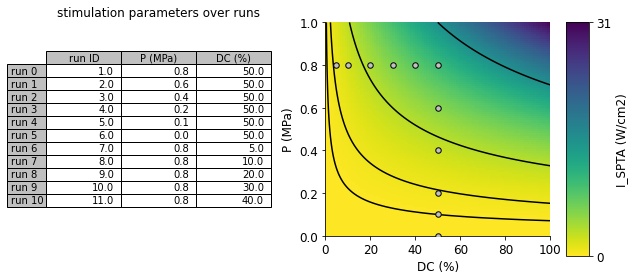

In [21]:
# Get the index dimensions of the fluorescence dataset
index_dims = {k: xtimeseries.index.unique(k) for k in xtimeseries.index.names}

# Create stats dataframes
logger.info('creating statistics dataframe')
stats = pd.DataFrame()

# Add information about pulse and time-average acoustic intensity to info table
output_info_table = add_intensity_to_table(output_info_table)

# Add experimental info to stats
if Label.P not in stats:
    logger.info('adding experimental info to stats...')
    exp_output_table = repeat_along_new_dims(
        output_info_table.drop(Label.NTRIALS, axis=1),
        {k: index_dims[k] for k in [Label.ROI, Label.TRIAL]})
    exp_output_table = exp_output_table.reorder_levels(
        [Label.ROI, Label.RUN, Label.TRIAL]).sort_index()
    stats = pd.concat([exp_output_table, stats], axis=1) 

# Compute sorted Ispta per run
sorted_ISPTAs = (stats[Label.ISPTA]
    .groupby(Label.RUN)
    .first()
    .sort_values()
    .apply('{:.2f} W/cm2'.format)
)

# Add info about discarded trials
logger.info('adding "discarded" labels...')
stats[Label.DISCARDED] = False
stats.loc[pd.IndexSlice[:, :, ITRIALS_DISCARD], Label.DISCARDED] = True

# If protocol determined by suffix
if Label.SUFFIX in output_info_table:
    # Plot suffix by run order (as processed by suite2p)
    figs['protocol_summary'] = plot_table(
        output_info_table[[Label.RUNID, Label.SUFFIX]].rename(f'run {{}}'.format) ,
        title='condition over runs', fs=10, aspect=1.5)
else:
    figs['protocol_summary'], axes = plt.subplots(1, 2, figsize=(8, 4))
    # Plot P-DC table by run order (as processed by suite2p)
    plot_table(
        output_info_table[[Label.RUNID, Label.P, Label.DC]].rename(f'run {{}}'.format),
        title='stimulation parameters over runs', 
        ax=axes[0], fs=10, aspect=1.1)
    # Plot P - DC combinations on Ispta map 
    plot_P_DC_map(
        P=output_info_table[Label.P],
        DC=output_info_table[Label.DC],
        dose_key=Label.ISPTA,
        ax=axes[1]
    )
    figs['protocol_summary'].tight_layout()

# Define output directory and file for processed data
processed_dir = get_output_equivalent(
    conditioning_dir, DataRoot.CONDITIONED, f'{DataRoot.PROCESSED}/{processing_id}')
processed_fpath = os.path.join(processed_dir, os.path.basename(conditioned_fpath))

# Load post-stimulus window size from file, if available
try:
    npost = load_post_window_size(processed_dir)
    logger.info(f'loaded post-stimulus window size = {npost} samples')
    fidx.npost = npost
except (ValueError, FileNotFoundError) as err:
    logger.warning(f'{err} -> resorting to default npost')

logger.info('stats table:')
stats

### Visualize population average baseline evolution throughout entire experiment

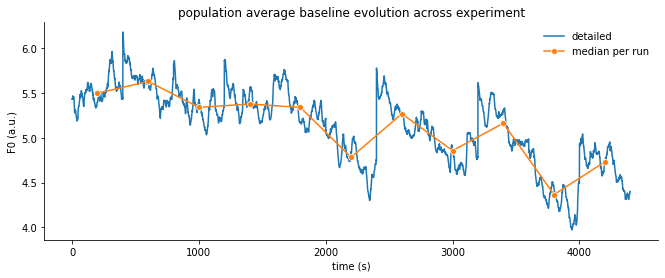

In [22]:
# Add time along entire experiment to population-average dataframe average
popagg_timeseries[Label.TIME] = get_index_along_experiment(
    popagg_timeseries.index, runid_map=output_info_table[Label.RUNID]) / fps

# Plot time evolution of average baseline (with median along each run)
figs['popavg F0 across experiment'], ax = plt.subplots(figsize=(11, 4))
sns.despine(ax=ax)
sns.lineplot(
    data=popagg_timeseries, 
    x=Label.TIME, y=Label.F0, errorbar=None, ax=ax, label='detailed')
sns.lineplot(
    data=popagg_timeseries.groupby(Label.RUN).median(), 
    x=Label.TIME, y=Label.F0, errorbar=None, ax=ax, marker='o', label='median per run')
ax.set_title(f'population average baseline evolution across experiment')
ax.legend(frameon=False)

# Remove time column
del popagg_timeseries[Label.TIME]

### Visualize activity traces and heatmaps

 2024/08/20 13:15:25: grouping data by ['run', 'frame'] and averaging...
 2024/08/20 13:15:25: adding time info to table...
 2024/08/20 13:15:26: Z(ΔF/F0): original 1782000-rows series is already rectilinear -> ignoring
 2024/08/20 13:15:26: adding time info to table...
 2024/08/20 13:15:27: plotting Z(ΔF/F0) trial heatmaps...


16it [00:12,  1.27it/s]                        


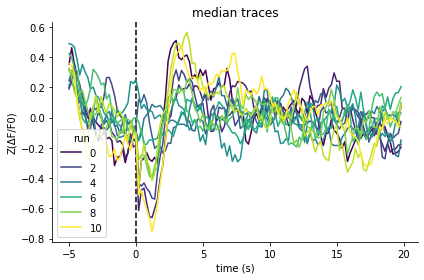

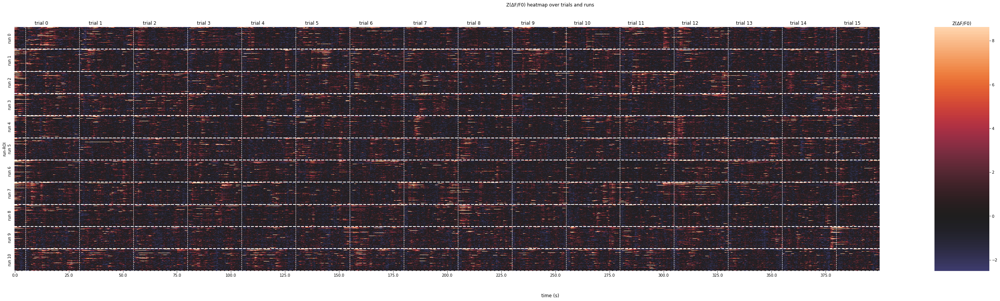

In [23]:
# Aggregate activity median traces per run
figs[f'{ykey_plt} aggregate traces'] = plot_aggregate_traces(
    xtimeseries, fidx, fps, ykey_plt, hue=Label.RUN, aggfunc=trial_aggfunc)

# Activity heatmaps over runs & trials, if specified
if plot_rasters:
    fk = f'{ykey_plt} heatmap over trials and runs'
    figs[fk] = plot_activity_heatmap(
        xtimeseries, ykey_plt, fidx, fps, col=Label.TRIAL, row=Label.RUN, rasterized=True)
    figs[fk].suptitle(fk);

### Inpsect population activity in baseline run, if any

 2024/08/20 13:16:34: plotting heatmap for baseline run (run 5)
 2024/08/20 13:16:34: sub-indexing data...
 2024/08/20 13:16:34: filtering data...
 2024/08/20 13:16:34: cross-checking filters...
 2024/08/20 13:16:34: Z(ΔF/F0): original 162000-rows series is already rectilinear -> ignoring
 2024/08/20 13:16:34: adding time info to table...
 2024/08/20 13:16:35: plotting Z(ΔF/F0) trial heatmaps...


16it [00:03,  4.12it/s]                        


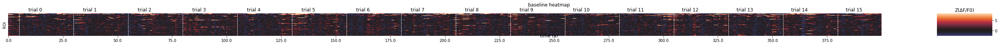

In [24]:
%%skip $has_no_baseline_run

if plot_rasters:
    logger.info(f'plotting heatmap for baseline run (run {irun_baseline})')
    figs['baseline_heatmap'] = plot_activity_heatmap(
        filter_data(xtimeseries, irun=irun_baseline), 
        ykey_plt, fidx, fps, col=Label.TRIAL, colwrap=ntrials_per_run, rasterized=True)
    figs['baseline_heatmap'].suptitle('baseline heatmap', y=1.3)

### Compute average pre-and post-stim values, as well as stim-evoked changes

In [25]:
# For each variable of interest
for ykey in [Label.DFF, Label.ZSCORE]:
    # Compute pre- and post-stimulus average, and their difference
    ystats = compute_evoked_change(
        xtimeseries, ykey, fidx, full_output=True)
    # Add columns to stats dataframe
    for k, s in ystats.items():
        stats[k] = s

 2024/08/20 13:16:41: applying mean function on ΔF/F0 in [18-26] index window across ROI, run, trial
 2024/08/20 13:16:41: applying mean function on ΔF/F0 in [26-40] index window across ROI, run, trial
 2024/08/20 13:16:41: computing evoked ΔF/F0 change...
 2024/08/20 13:16:42: applying mean function on Z(ΔF/F0) in [18-26] index window across ROI, run, trial
 2024/08/20 13:16:42: applying mean function on Z(ΔF/F0) in [26-40] index window across ROI, run, trial
 2024/08/20 13:16:42: computing evoked Z(ΔF/F0) change...


### Plot stimulus-evoked responses

 2024/08/20 13:16:43: plotting evoked Z(ΔF/F0) change distribution across run and trial
 2024/08/20 13:16:43: computing trial-median of data over ROI, run...
 2024/08/20 13:16:43: computing number of valid trials per ROI, run
 2024/08/20 13:16:43: rescaling z-score columns ['evoked Z(ΔF/F0) change']


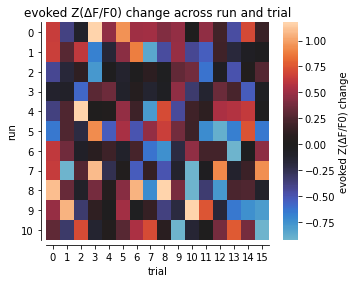

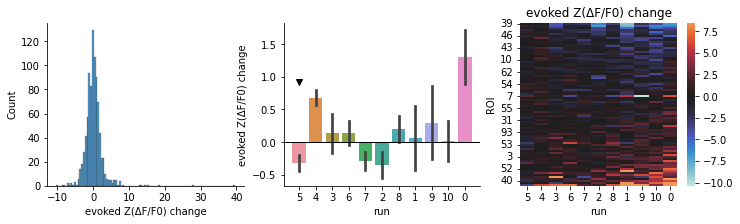

In [26]:
# Get change key
ykey_diff = get_change_key(ykey_plt)

# Plot heatmap of average evoked response across runs & trials
runseq = stats[Label.RUNID].groupby(Label.RUN).first().sort_values().index
figs[f'{ykey_diff} map'] = plot_stat_heatmap(
    stats, 
    rowkey=Label.RUN,
    colkey=Label.TRIAL,
    ykey=ykey_diff,
)

# Plot evoked change graphs
figs[f'{ykey_diff} graphs'] = plot_stat_graphs(
    get_trial_aggregated(stats[[ykey_diff]], aggfunc=trial_aggfunc), 
    ykey_diff, run_order=sorted_ISPTAs, irun_marker=irun_P0)

### Identify & reject trials with significant stimulus-evoked motion artefact

 2024/08/20 13:16:46: computing diplacement velocity over time from registration offsets...
 2024/08/20 13:16:46: correcting displacement velocity at indices [25] to compensate for frames substitution...
 2024/08/20 13:16:48: identified 7 / 176 trials (4.0%) with abnormal peak or average displacement velocities
 2024/08/20 13:16:48: identified 1458/14256 (10.2%) samples with [discarded, motion] tags
 2024/08/20 13:16:48: identifying conditions with >= 5 valid trials
 2024/08/20 13:16:48: identified 1458/14256 (10.2%) samples with [discarded, motion] tags
 2024/08/20 13:16:48: identifying conditions with >= 5 valid trials
 2024/08/20 13:16:48: adding expanded validity index to timeseries ...
 2024/08/20 13:16:49: filtering timeseries ...
 2024/08/20 13:16:53: grouping data by ['motion', 'frame'] and averaging...
 2024/08/20 13:16:53: adding time info to table...
 2024/08/20 13:16:53: grouping data by ['run', 'frame'] and averaging...
 2024/08/20 13:16:54: adding time info to table...
 2

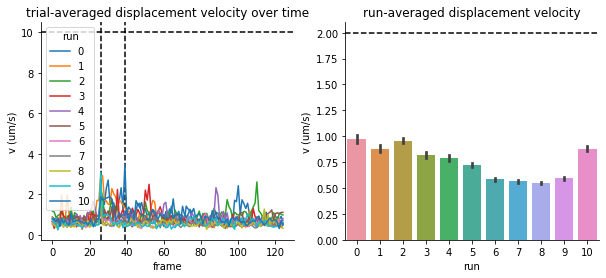

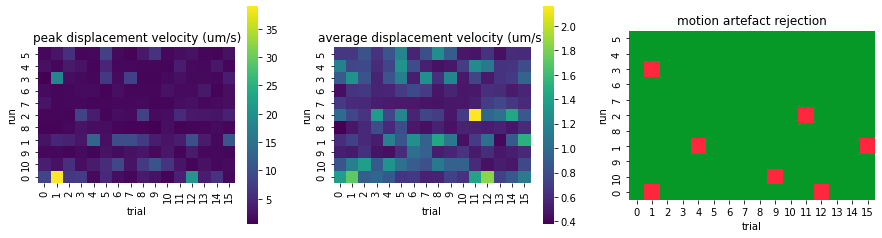

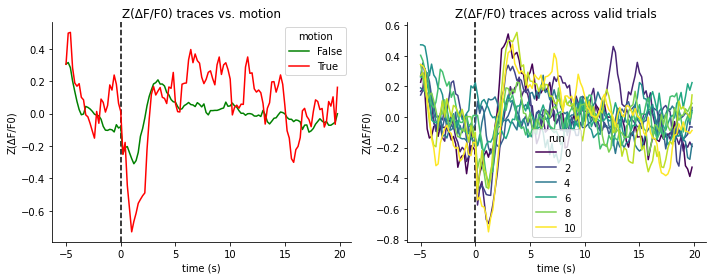

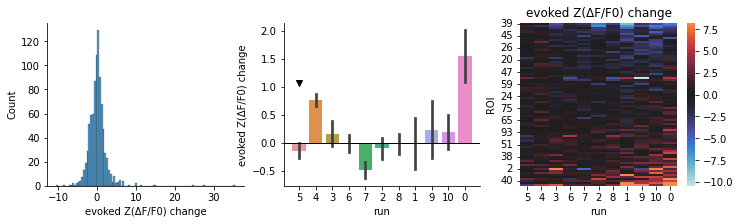

In [27]:
# Create (run, trial, frame) multi-index
exp_mux_keys = [Label.RUN, Label.TRIAL, Label.FRAME]
exp_mux = pd.MultiIndex.from_product(
    [index_dims[k] for k in exp_mux_keys], names=exp_mux_keys)

# Compute displacement velocity profiles
if isinstance(ss, StackSubstitutor):
    isubs = [max(x[:2]) for x in ss.parse_submap() if abs(x[0] - x[1]) == 1]
else:
    isubs = None
vdisp = compute_displacement_velocity(s2p_ops, exp_mux, um_per_px, fps, isubs=isubs)

# Plot average displacement velocity profile for each run
post_window = fidx.get_window_slice('post')
figs['vdisp_profiles'], axes = plt.subplots(1, 2, figsize=(10, 4))
for ax in axes:
    sns.despine(ax=ax)
ax = axes[0]
ax.set_title('trial-averaged displacement velocity over time')
for idx in bounds(post_window):
    ax.axvline(idx, c='k', ls='--')
sns.lineplot(
    data=vdisp.to_frame(), x=Label.FRAME, y=vdisp.name, ax=ax,
    hue=Label.RUN, errorbar=None, palette='tab10')
ax.axhline(VDISP_PEAK_THR, ls='--', c='k')
ax = axes[1]
ax.set_title('run-averaged displacement velocity')
sns.barplot(
    data=vdisp.to_frame().reset_index(), 
    x=Label.RUN, 
    y=vdisp.name, 
    ax=ax, 
    errorbar='se'
)
ax.axhline(VDISP_AVG_THR, ls='--', c='k')

# Compute peak of displacement velocity within response window for each run and trial
# and assess if motion exceeded threshold
vdisp_window = vdisp.loc[pd.IndexSlice[:, :, post_window]]
vdisp_metrics = vdisp_window.groupby([Label.RUN, Label.TRIAL]).agg(
    find_response_peak).rename(Label.PEAK_DISP_VEL).to_frame()
vdisp_metrics[Label.MOTION] = vdisp_metrics[Label.PEAK_DISP_VEL] > VDISP_PEAK_THR

# Compute average of displacement velocity across trial interval for each run and trial
# and assess if motion exceeded threshold
vdisp_metrics[Label.AVG_DISP_VEL] = vdisp.groupby([Label.RUN, Label.TRIAL]).mean()
vdisp_metrics[Label.MOTION] = np.logical_or(
    vdisp_metrics[Label.MOTION],
    vdisp_metrics[Label.AVG_DISP_VEL] > VDISP_AVG_THR)

# Add displacement velocity metrics and motion status info to stats
exp_vdisp_metrics = repeat_along_new_dim(
    vdisp_metrics, Label.ROI, stats.index.unique(Label.ROI)
    ).swaplevel(0, 2).swaplevel(1, 2).sort_index()
for k in exp_vdisp_metrics:
    stats[k] = exp_vdisp_metrics[k]

# Add stimulus parameters info to vdisp metrics dataframe
vdisp_metrics = pd.concat([vdisp_metrics, repeat_along_new_dim(
    output_info_table[[Label.P, Label.DC, Label.ISPTA]],
    Label.TRIAL, exp_mux.unique(level=Label.TRIAL))], axis=1)

if Label.SUFFIX is None:
    # Plot dependency of motion artefact on pressure & duty cycle 
    figs['vdispmetrics_vs_stimparams'], axes = plt.subplots(2, 3, figsize=(12, 8))
    figs['vdispmetrics_vs_stimparams'].suptitle('dependency of motion artefact on stimulus parameters')
    for axrow, ykey, vcrit in zip(axes, [Label.PEAK_DISP_VEL, Label.AVG_DISP_VEL], [VDISP_PEAK_THR, VDISP_AVG_THR]):
        for ax, xkey in zip(axrow, [Label.P, Label.DC]):
            sns.lineplot(
                data=get_xdep_data(vdisp_metrics, xkey), x=xkey, y=ykey, ax=ax)
        sns.lineplot(data=vdisp_metrics, x=Label.ISPTA, y=ykey, ax=axrow[-1])
        for ax in axrow:
            sns.despine(ax=ax)
            ax.axhline(vcrit, ls='--', c='k')
            ax.set_ylim(0, ax.get_ylim()[1])

# Plot peak and average displacement velocities and motion artefact rejection heatmaps
figs['vdispmetrics_motionreject_maps'], axes = plt.subplots(1, 3, figsize=(15, 4))
for ax in axes:
    ax.set_aspect(1.)
ax = axes[0]
ax.set_title(Label.PEAK_DISP_VEL)
sns.heatmap(
    vdisp_metrics[Label.PEAK_DISP_VEL].unstack().reindex(
        sorted_ISPTAs.index.values, axis=0),
    ax=ax, cmap=nan_viridis)
ax = axes[1]
ax.set_title(Label.AVG_DISP_VEL)
sns.heatmap(
    vdisp_metrics[Label.AVG_DISP_VEL].unstack().reindex(
        sorted_ISPTAs.index.values, axis=0),
    ax=ax, cmap=nan_viridis)
ax = axes[2]
ax.set_title('motion artefact rejection')
sns.heatmap(
    vdisp_metrics[Label.MOTION].unstack().reindex(
        sorted_ISPTAs.index.values, axis=0),
    ax=ax, cmap=rdgn, cbar=False)

# Log identified motion trials
nmotion = vdisp_metrics[Label.MOTION].sum()
ntot = len(vdisp_metrics)
logger.info(
    f'identified {nmotion} / {ntot} trials ({nmotion / ntot * 1e2:.1f}%)'
    f' with abnormal peak or average displacement velocities')

# Compute new valid stats & timeseries
vstats = valid(stats)
vtimeseries = valid_timeseries(xtimeseries, stats)

# Plot activity traces for both categories, and valid across runs
figs[f'{ykey_plt} motion filtering'], axes = plt.subplots(1, 2, figsize=(10, 4))
plot_aggregate_traces(
    expand_and_add(stats[Label.MOTION].to_frame(), xtimeseries.copy()),
    fidx, fps, ykey_plt, hue=Label.MOTION, cmap={True: 'r', False: 'g'}, ax=axes[0],
    aggfunc=trial_aggfunc)
axes[0].set_title(f'{ykey_plt} traces vs. motion')
plot_aggregate_traces(
    vtimeseries, fidx, fps, ykey_plt, hue=Label.RUN, ax=axes[1],
    aggfunc=trial_aggfunc)
axes[1].set_title(f'{ykey_plt} traces across valid trials')

# Plot evoked change graphs
figs[f'{ykey_diff} motion filtering'] = plot_stat_graphs(
    get_trial_aggregated(vstats[[ykey_diff]], aggfunc=trial_aggfunc), 
    ykey_diff, run_order=sorted_ISPTAs, irun_marker=irun_P0)

### Identify & reject trials with pre-stimulus activity and/or "inhibition"

 2024/08/20 13:16:58: analyzing Z(ΔF/F0) relative pre-stimulus levels...
 2024/08/20 13:16:58: setting pre-stimulus Z(ΔF/F0) absolute outlier threshold to 3000.000
 2024/08/20 13:16:58: identified:
   - 0/14256 trials (0.00%) significant pre-stimulus activity
   - 0/14256 trials (0.00%) significant pre-stimulus inhibition
   - 0/14256 trials (0.00%) pre-stimulus outlier data
 2024/08/20 13:16:59: identified 0/176 trials (0.0%) with more than 50.0 % pre-active cells
 2024/08/20 13:16:59: identified 1458/14256 (10.2%) samples with [discarded, motion, pre-stim cell activity?, pre-stim population activity?, pre-stim cell inhibition?] tags
 2024/08/20 13:16:59: identifying conditions with >= 5 valid trials
 2024/08/20 13:16:59: identified 1458/14256 (10.2%) samples with [discarded, motion, pre-stim cell activity?, pre-stim population activity?, pre-stim cell inhibition?] tags
 2024/08/20 13:16:59: identifying conditions with >= 5 valid trials
 2024/08/20 13:16:59: adding expanded validity i

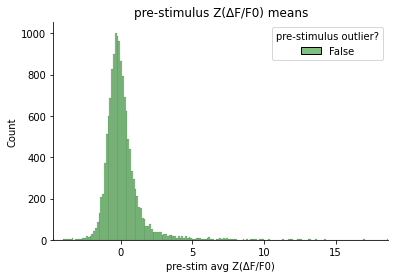

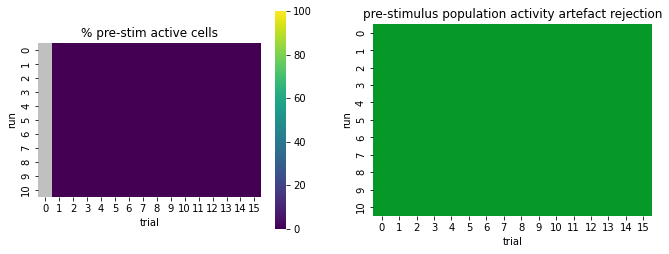

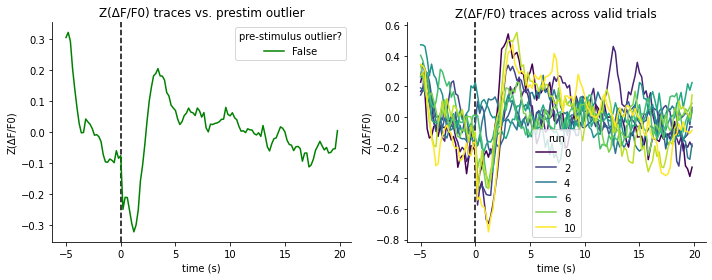

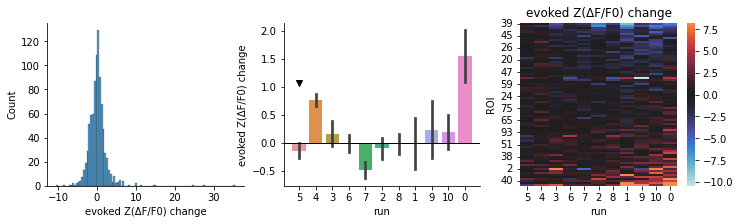

In [28]:
# Compute mean z-score in pre-stimulus window for each trial
logger.info(f'analyzing {Label.ZSCORE} relative pre-stimulus levels...')
zprestim_key = get_change_key(Label.ZSCORE, full_output=True)[0]
z_prestim_thr = ZTHR_REJECTION

# Classify pre-stimulus state on a per-ROI basis for each trial
logger.info(
    f'setting pre-stimulus {Label.ZSCORE} absolute outlier threshold to {z_prestim_thr:.3f}')
stats[Label.PRESTIM_ACTIVITY] = stats[zprestim_key] > z_prestim_thr
stats[Label.PRESTIM_INHIBITION] = stats[zprestim_key] < -z_prestim_thr
stats[Label.PRESTIM_OUTLIER] = stats[[
        Label.PRESTIM_INHIBITION,
        Label.PRESTIM_ACTIVITY, 
    ]].any(axis=1)
npreacts = stats[Label.PRESTIM_ACTIVITY].sum()
npreinhibs = stats[Label.PRESTIM_INHIBITION].sum()
npreoutliers = stats[Label.PRESTIM_OUTLIER].sum()
ntot = len(stats)
outlierslog = [
    (stats[Label.PRESTIM_ACTIVITY].sum(), 'significant pre-stimulus activity'),
    (stats[Label.PRESTIM_INHIBITION].sum(), 'significant pre-stimulus inhibition'),
    (stats[Label.PRESTIM_OUTLIER].sum(), 'pre-stimulus outlier data')
]
outlierslog = '\n'.join([
    f'   - {n}/{ntot} trials ({n / ntot * 100:.2f}%) {k}' for n, k in outlierslog])
logger.info(f'identified:\n{outlierslog}')

# Plot histogram of pre-stimulus means
figs['prestim means dist'], ax = plt.subplots()
ax.set_title(f'pre-stimulus {Label.ZSCORE} means')
sns.despine(ax=ax)
sns.histplot(
    data=stats, x=zprestim_key, ax=ax, bins=400,
    hue=Label.PRESTIM_OUTLIER, palette={True: 'r', False: 'g'})
for z in [
        -z_prestim_thr,
        z_prestim_thr
    ]:
    ax.axvline(z, c='k', ls='--')
ax.set_xlim(stats[zprestim_key].quantile(.001), stats[zprestim_key].quantile(.999))

# Compute fraction of ROIs with pre-stimulus activity for each run & trial
nROIs = len(stats.index.unique(level=Label.ROI))
npreacts_per_run_trial = stats.loc[:, Label.PRESTIM_ACTIVITY].groupby(
    [Label.RUN, Label.TRIAL]).sum()
isdiscarded = stats[Label.DISCARDED].groupby([Label.RUN, Label.TRIAL]).first()
npreacts_per_run_trial.loc[isdiscarded[isdiscarded].index] = np.nan
pct_preacts_per_run_trial = (npreacts_per_run_trial / nROIs * 1e2).rename(Label.PCT_PREACTIVE_CELLS)

# Label trials with large fraction of pre-active cells
pop_preact_per_run_trial = (pct_preacts_per_run_trial > PCT_PREACTIVE_THR).rename(
    Label.PRESTIM_POP_ACTIVITY)
npreacts_pop, ntot = pop_preact_per_run_trial.sum(), len(pop_preact_per_run_trial)
logger.info(
    f'identified {npreacts_pop}/{ntot} trials ({npreacts_pop / ntot * 100:.1f}%)'
    f' with more than {PCT_PREACTIVE_THR} % pre-active cells')
exp_pop_preact_per_run_trial = repeat_along_new_dim(
    pop_preact_per_run_trial.to_frame(),
    Label.ROI, stats.index.unique(level=Label.ROI)).reorder_levels(
    [Label.ROI, Label.RUN, Label.TRIAL]).sort_index()
stats[Label.PRESTIM_POP_ACTIVITY] = exp_pop_preact_per_run_trial

# Plot pre-stimulus population activity rejection heatmap
figs['prestim active & reject maps'], axes = plt.subplots(1, 2, figsize=(11, 4))
for ax in axes:
    ax.set_aspect(1.)
ax = axes[0]
ax.set_title(Label.PCT_PREACTIVE_CELLS)
sns.heatmap(pct_preacts_per_run_trial.unstack(), ax=ax, vmin=0, vmax=100, cmap=nan_viridis)
ax = axes[1]
ax.set_title('pre-stimulus population activity artefact rejection')
sns.heatmap(pop_preact_per_run_trial.unstack(), ax=ax, cmap=rdgn, cbar=False)

# Compute new valid stats & timeseries
vstats = valid(stats)
vtimeseries = valid_timeseries(xtimeseries, stats)

# Plot activity traces for both categories, and valid across runs
figs[f'{ykey_plt} prestim filtering'], axes = plt.subplots(1, 2, figsize=(10, 4))
plot_aggregate_traces(
    expand_and_add(stats[Label.PRESTIM_OUTLIER].to_frame(), xtimeseries.copy()),
    fidx, fps, Label.ZSCORE, hue=Label.PRESTIM_OUTLIER, cmap={True: 'r', False: 'g'}, ax=axes[0],
    aggfunc=trial_aggfunc)
axes[0].set_title(f'{ykey_plt} traces vs. prestim outlier')
plot_aggregate_traces(
    vtimeseries, fidx, fps, ykey_plt, hue=Label.RUN, ax=axes[1],
    aggfunc=trial_aggfunc)
axes[1].set_title(f'{ykey_plt} traces across valid trials')

# Plot evoked change graphs
figs[f'{ykey_diff} prestim filtering'] = plot_stat_graphs(
    get_trial_aggregated(vstats[[ykey_diff]], aggfunc=trial_aggfunc), 
    ykey_diff, run_order=sorted_ISPTAs, irun_marker=irun_P0)

### Inspect impact of exclusion criteria on trial-averaged activity

 2024/08/20 13:17:09: plotting % of excluded samples per ROI, across criteria
 2024/08/20 13:17:09: adding time info to table...
 2024/08/20 13:17:09: identifying conditions with >= 5 valid trials
 2024/08/20 13:17:09: adding expanded validity index to timeseries ...
 2024/08/20 13:17:10: filtering timeseries ...
 2024/08/20 13:17:15: identified 891/14256 (6.2%) samples with "discarded" tag
 2024/08/20 13:17:15: identifying conditions with >= 5 valid trials
 2024/08/20 13:17:15: adding expanded validity index to timeseries ...
 2024/08/20 13:17:16: filtering timeseries ...
 2024/08/20 13:17:20: identified 567/14256 (4.0%) samples with "motion" tag
 2024/08/20 13:17:20: identifying conditions with >= 5 valid trials
 2024/08/20 13:17:20: adding expanded validity index to timeseries ...
 2024/08/20 13:17:21: filtering timeseries ...
 2024/08/20 13:17:26: identified 0/14256 (0.0%) samples with "pre-stim cell activity?" tag
 2024/08/20 13:17:26: identifying conditions with >= 5 valid trials

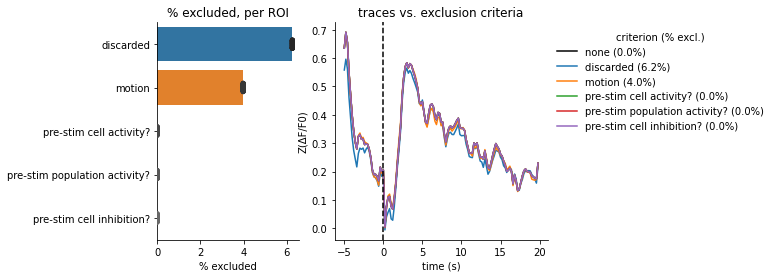

In [29]:
# Plot pct of exclusion per criterion and traces vs exclusion criteria
figs['impact of exclusion criteria'], axes = plt.subplots(
    1, 2, figsize=(7, 4), width_ratios=[1, 1.5])
plot_pct_excluded(stats, ax=axes[0]);
plot_traces_vs_exclusion(xtimeseries, stats, Label.ZSCORE, fidx=fidx, ax=axes[1]);

### Visualize number of valid trials per ROI & condition, and number of valid conditions per ROI 

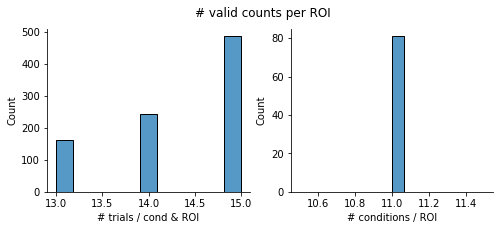

In [30]:
ntrials_per_cond = (
    vstats.iloc[:, 0]
    .groupby([Label.ROI, Label.RUN])
    .count()
    .rename('# trials / cond & ROI')
)
nvalidconds_per_ROI = (
    ntrials_per_cond
    .groupby(Label.ROI)
    .count()
    .rename('# conditions / ROI')
)
figs['valid_counts'], axes = plt.subplots(1, 2, figsize=(8, 3))
figs['valid_counts'].suptitle('# valid counts per ROI')
for ax in axes:
    sns.despine(ax=ax)
sns.histplot(ntrials_per_cond, ax=axes[0], bins=nruns)
sns.histplot(nvalidconds_per_ROI, ax=axes[1], bins=ntrials_per_run);

### Visualize curated activity traces and heatmaps

 2024/08/20 13:17:47: grouping data by ['run', 'frame'] and averaging...
 2024/08/20 13:17:47: adding time info to table...
 2024/08/20 13:17:48: Z(ΔF/F0): expanding 1599750-rows series into 81 ROIs x 11 runs x 15 trials x 125 frames (1670625-rows) series (70875 additional rows)
 2024/08/20 13:17:50: adding time info to table...
 2024/08/20 13:17:50: plotting Z(ΔF/F0) trial heatmaps...


15it [00:11,  1.34it/s]                        

 2024/08/20 13:18:02: plotting evoked Z(ΔF/F0) change distribution across run and trial


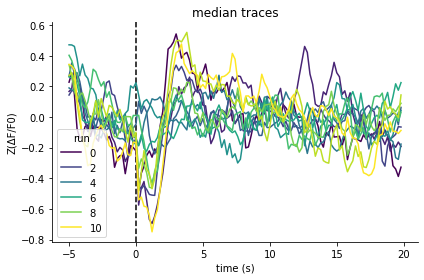

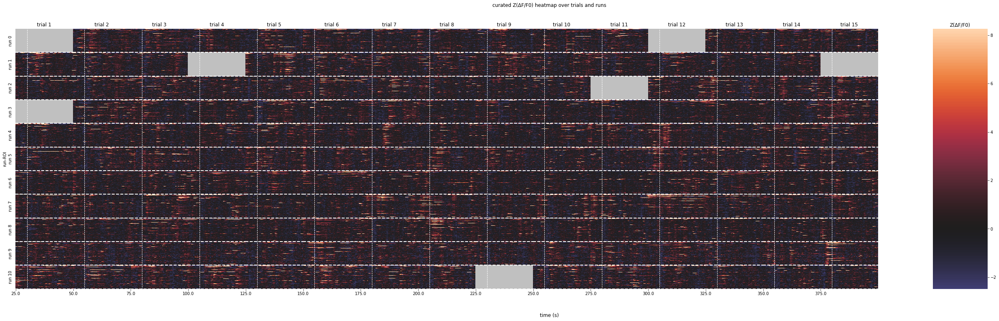

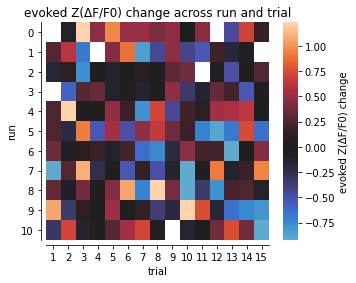

In [31]:
# Aggregate activity traces per run
figs[f'curated {ykey_plt} aggregate traces'] = plot_aggregate_traces(
    vtimeseries, fidx, fps, ykey_plt, hue=Label.RUN,
    aggfunc=trial_aggfunc)

# Activity heatmaps over runs & trials
if plot_rasters:
    fk = f'curated {ykey_plt} heatmap over trials and runs'
    figs[fk] = plot_activity_heatmap(
        vtimeseries, ykey_plt, fidx, fps, col=Label.TRIAL, row=Label.RUN, rasterized=True)
    figs[fk].suptitle(fk);

# Evoked response heatmap across runs & trials
figs[f'curated_evoked_{ykey_plt}_map'] = plot_stat_heatmap(
    vstats, 
    rowkey=Label.RUN,
    colkey=Label.TRIAL,
    ykey=get_change_key(ykey_plt),
)

### Plot response heatmap for reference condition

 2024/08/20 13:18:08: extracting stats for reference condition...
 2024/08/20 13:18:08: sorting evoked Z(ΔF/F0) change across ROI...
 2024/08/20 13:18:08: plotting evoked Z(ΔF/F0) change distribution across ROI and trial


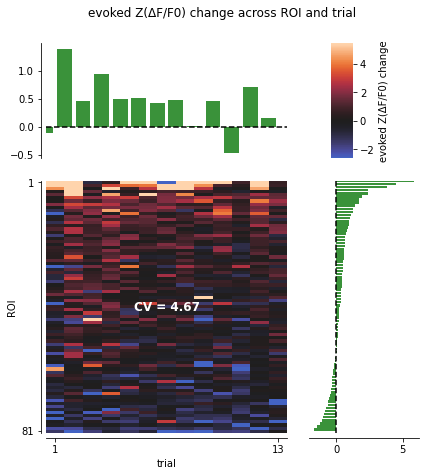

In [32]:
# Extract run index for reference condition, if present
try:
    irun_refcond = extract_run_index(output_info_table)
except ValueError:
    logger.info('no reference condition found in output table')
    irun_refcond = None

# If reference condition is available
if irun_refcond is not None:
    # Extract stats for reference condition
    logger.info(f'extracting stats for reference condition...')
    refstats = (
        vstats
        .loc[pd.IndexSlice[:, irun_refcond, :], :]
        .droplevel(Label.RUN)
    )
    # Plot response heatmap and marginal profiles
    figs[f'{ykey_diff} heatmap'] = plot_stat_heatmap(
        refstats,
        ykey=get_change_key(ykey_plt),
        sortby='row',
        add_marginals=True, 
        marg_color=Palette.LINE[mouseline],
        sparse_ticks='xy',
        add_cv=True 
    )

### Aggregate timeseries and stats over valid trials

In [34]:
# Aggregate stats and timeseries over valid trials
logger.info('computing trial-aggregated stats and timeseries over valid trials...')
trialagg_stats = get_trial_aggregated(vstats, aggfunc=trial_aggfunc)
trialagg_timeseries = get_trial_aggregated(vtimeseries, aggfunc=trial_aggfunc)

# Print trial-aggregated stats
logger.info('trial-aggregated stats:')
trialagg_stats

 2024/08/20 13:18:31: computing trial-aggregated stats and timeseries over valid trials...
 2024/08/20 13:18:31: data contains non-numeric columns -> string-proofing aggfunc
 2024/08/20 13:18:31: computing trial-median of data over ROI, run...
 2024/08/20 13:18:35: computing number of valid trials per ROI, run
 2024/08/20 13:18:35: rescaling z-score columns ['pre-stim avg Z(ΔF/F0)', 'post-stim avg Z(ΔF/F0)', 'evoked Z(ΔF/F0) change']
 2024/08/20 13:18:35: computing trial-median of data over ROI, run, frame...
 2024/08/20 13:18:35: computing number of valid trials per ROI, run, frame
 2024/08/20 13:18:35: rescaling z-score columns ['Z(ΔF/F0)']
 2024/08/20 13:18:35: trial-aggregated stats:


line  trial_length  PRF (Hz)  duration (s)  fps  P (MPa)  DC (%)  \
ROI run                                                                       
0   0    cresst         125.0     100.0           0.2  5.0      0.8    50.0   
    1    cresst         125.0     100.0           0.2  5.0      0.6    50.0   
    2    cresst         125.0     100.0           0.2  5.0      0.4    50.0   
    3    cresst         125.0     100.0           0.2  5.0      0.2    50.0   
    4    cresst         125.0     100.0           0.2  5.0      0.1    50.0   
...         ...           ...       ...           ...  ...      ...     ...   
96  6    cresst         125.0     100.0           0.2  5.0      0.8     5.0   
    7    cresst         125.0     100.0           0.2  5.0      0.8    10.0   
    8    cresst         125.0     100.0           0.2  5.0      0.8    20.0   
    9    cresst         125.0     100.0           0.2  5.0      0.8    30.0   
    10   cresst         125.0     100.0           0.2  5.0      0.8    40.0   

         run ID  I_SPPA (W/cm2)  I_SPTA (W/cm2)  pre-stim avg ΔF/F0  \
ROI run                                                               
0   0       1.0       19.784475        9.892238           -0.070979   
    1       2.0       11.128767        5.564384           -0.052906   
    2       3.0        4.946119        2.473059           -0.060591   
    3       4.0        1.236530        0.618265            0.043942   
    4       5.0        0.309132        0.154566           -0.020972   
...         ...             ...             ...                 ...   
96  6       7.0       19.784475        0.989224           -0.008525   
    7       8.0       19.784475        1.978448            0.026371   
    8       9.0       19.784475        3.956895           -0.011999   
    9      10.0       19.784475        5.935343           -0.029528   
    10     11.0       19.784475        7.913790           -0.023595   

         post-stim avg ΔF/F0  evoked ΔF/F0 change  pre-stim avg Z(ΔF/F0)  \
ROI run                                                                    
0   0               0.162878             0.172164              -4.063480   
    1               0.378624             0.431529              -3.028813   
    2               0.004811             0.033750              -3.599719   
    3               0.073786             0.018638               2.610625   
    4               0.100181            -0.003030              -1.289682   
...                      ...                  ...                    ...   
96  6              -0.044638            -0.042412              -0.503464   
    7              -0.035168            -0.047751               1.557354   
    8              -0.023673            -0.051084              -0.708618   
    9              -0.016092            -0.013796              -1.743746   
    10             -0.008074             0.027642              -1.346122   

         post-stim avg Z(ΔF/F0)  evoked Z(ΔF/F0) change  \
ROI run                                                   
0   0                  9.324656                9.856262   
    1                 21.675901               24.704714   
    2                  0.285816                2.005114   
    3                  4.383634                1.107279   
    4                  6.160691               -0.186350   
...                         ...                     ...   
96  6                 -2.636091               -2.504614   
    7                 -2.076849               -2.819929   
    8                 -1.398023               -3.016768   
    9                 -0.950285               -0.814730   
    10                -0.460656                1.577024   

         peak displacement velocity (um/s)  \
ROI run                                      
0   0                             3.278225   
    1                             3.536348   
    2                             2.222193   
    3                             1.580244   
    4                     

### Visualize relative trial-averaged traces and heatmaps

 2024/08/20 13:18:37: grouping data by ['run', 'frame'] and averaging...
 2024/08/20 13:18:37: adding time info to table...
 2024/08/20 13:18:37: Z(ΔF/F0): original 111375-rows series is already rectilinear -> ignoring
 2024/08/20 13:18:37: adding time info to table...
 2024/08/20 13:18:38: plotting Z(ΔF/F0) trial heatmaps...


11it [00:02,  4.10it/s]                        


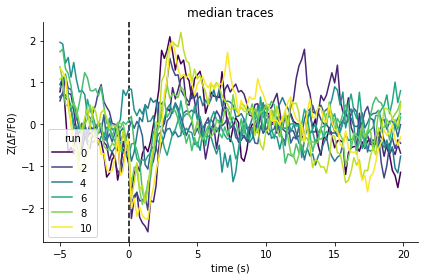

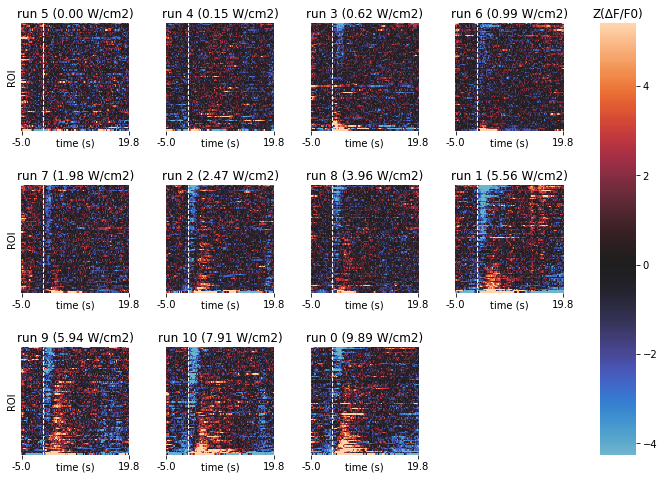

In [35]:
# Plot trial-aggregated traces for each run
figs[f'trial-averaged aggregate {ykey_plt} traces valid'] = plot_aggregate_traces(
    trialagg_timeseries, fidx, fps, ykey_plt, 
    hue=Label.RUN,  
    aggfunc=trial_aggfunc
)

# Plot trial-aggregated heatmaps for each run
figs[f'{ykey_plt} heatmaps'] = plot_activity_heatmap(
    trialagg_timeseries, ykey_plt, fidx, fps, 
    col=Label.RUN,
    col_order=sorted_ISPTAs.index.values, 
    col_labels=sorted_ISPTAs.values,
    sort_ROIs=True,
    rasterized=True
)

### Response traces, pressure & duty cycle dependency

 2024/08/20 13:18:43: adding ['fps' 'duration (s)' 'P (MPa)' 'DC (%)' 'I_SPTA (W/cm2)'] information to timeseries...
 2024/08/20 13:18:43: adding time info to table...
 2024/08/20 13:18:43: sub-indexing data...
 2024/08/20 13:18:43: filtering data...
 2024/08/20 13:18:43: cross-checking filters...
 2024/08/20 13:18:43: grouping by P (MPa), averaging and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:44: sub-indexing data...
 2024/08/20 13:18:44: filtering data...
 2024/08/20 13:18:44: cross-checking filters...
 2024/08/20 13:18:44: grouping by DC (%), averaging and plotting mean Z(ΔF/F0) vs. time (s) ...


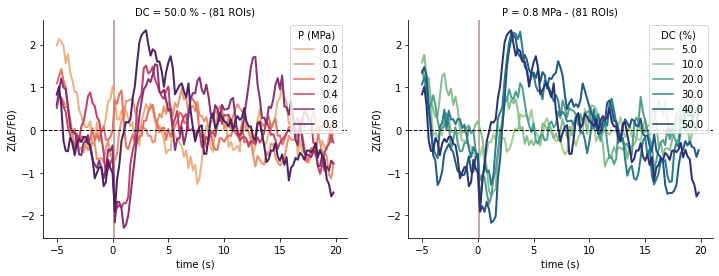

In [36]:
plt_data = get_plot_data(trialagg_timeseries, trialagg_stats, fidx)
tracekwargs = dict(
    errorbar=None,
    yref=0.,
)
if Label.SUFFIX not in output_info_table:
    figs['traces params deps'], axes = plt.subplots(1, 2, figsize=(12, 4))
    # Pressure dependency
    plot_responses(
        plt_data, ykey=ykey_plt, DC=DC_REF, hue=Label.P, ax=axes[0], **tracekwargs)
    # DC dependency
    plot_responses(
        plt_data, ykey=ykey_plt, P=P_REF, hue=Label.DC, ax=axes[1], **tracekwargs)
    for ax in axes:
        sns.despine(ax=ax)
    harmonize_axes_limits(axes)

### Heatmaps & average trace together, for pressure & DC

 2024/08/20 13:18:47: Z(ΔF/F0): original 111375-rows series is already rectilinear -> ignoring
 2024/08/20 13:18:47: adding time info to table...
 2024/08/20 13:18:47: plotting Z(ΔF/F0) trial heatmaps...


6it [00:01,  3.98it/s]                       

 2024/08/20 13:18:48: skipping run 6
 2024/08/20 13:18:48: skipping run 7
 2024/08/20 13:18:48: skipping run 8
 2024/08/20 13:18:48: skipping run 9
 2024/08/20 13:18:48: skipping run 10


6it [00:01,  3.93it/s]

 2024/08/20 13:18:48: sub-indexing data...
 2024/08/20 13:18:48: filtering data...
 2024/08/20 13:18:48: cross-checking filters...
 2024/08/20 13:18:48: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:49: sub-indexing data...
 2024/08/20 13:18:49: filtering data...
 2024/08/20 13:18:49: cross-checking filters...
 2024/08/20 13:18:49: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...


 2024/08/20 13:18:49: sub-indexing data...
 2024/08/20 13:18:49: filtering data...
 2024/08/20 13:18:49: cross-checking filters...
 2024/08/20 13:18:49: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:49: sub-indexing data...
 2024/08/20 13:18:49: filtering data...
 2024/08/20 13:18:49: cross-checking filters...
 2024/08/20 13:18:49: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:49: sub-indexing data...
 2024/08/20 13:18:49: filtering data...
 2024/08/20 13:18:49: cross-checking filters...
 2024/08/20 13:18:49: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:49: sub-indexing data...
 2024/08/20 13:18:49: filtering data...
 2024/08/20 13:18:49: cross-checking filters...
 2024/08/20 13:18:49: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:49: Z(ΔF/F0): original

 20%|██        | 1/5 [00:00<00:01,  3.64it/s]

 2024/08/20 13:18:50: skipping run 1
 2024/08/20 13:18:50: skipping run 2
 2024/08/20 13:18:50: skipping run 3
 2024/08/20 13:18:50: skipping run 4
 2024/08/20 13:18:50: skipping run 5


6it [00:01,  3.97it/s]                       

 2024/08/20 13:18:51: sub-indexing data...
 2024/08/20 13:18:51: filtering data...
 2024/08/20 13:18:51: cross-checking filters...
 2024/08/20 13:18:51: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:51: sub-indexing data...
 2024/08/20 13:18:51: filtering data...
 2024/08/20 13:18:51: cross-checking filters...
 2024/08/20 13:18:51: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...


 2024/08/20 13:18:52: sub-indexing data...
 2024/08/20 13:18:52: filtering data...
 2024/08/20 13:18:52: cross-checking filters...
 2024/08/20 13:18:52: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:52: sub-indexing data...
 2024/08/20 13:18:52: filtering data...
 2024/08/20 13:18:52: cross-checking filters...
 2024/08/20 13:18:52: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:52: sub-indexing data...
 2024/08/20 13:18:52: filtering data...
 2024/08/20 13:18:52: cross-checking filters...
 2024/08/20 13:18:52: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2024/08/20 13:18:52: sub-indexing data...
 2024/08/20 13:18:52: filtering data...
 2024/08/20 13:18:52: cross-checking filters...
 2024/08/20 13:18:52: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...


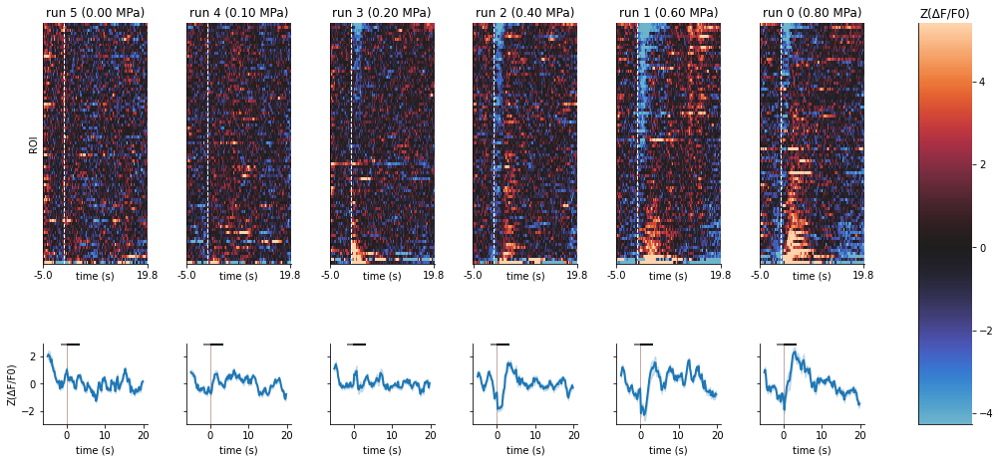

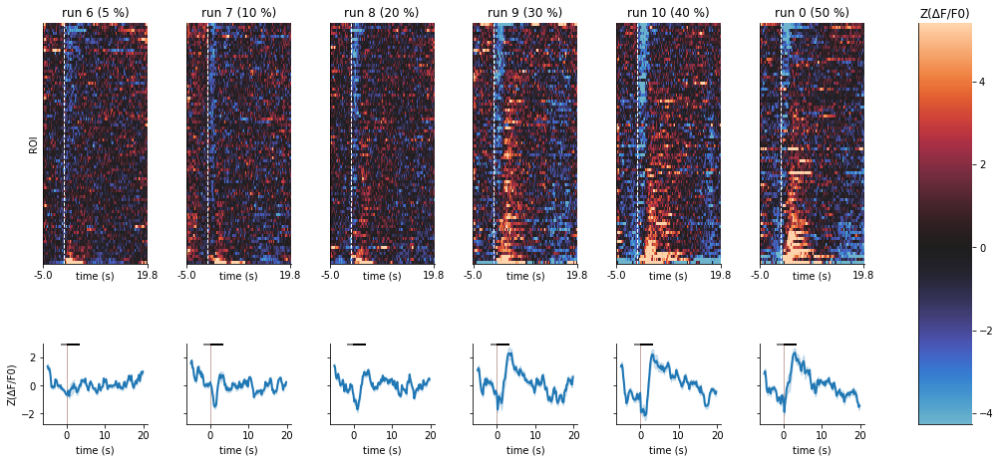

In [37]:
for xkey, xfmt in zip([Label.P, Label.DC], ['{:.2f} MPa', '{:.0f} %']):
    # Get sorted list of runs pertaining to parameter sweep
    sorted_xkeys = (
        get_xdep_data(trialagg_stats, xkey)[xkey]
        .groupby(Label.RUN).first().sort_values()
        .apply(xfmt.format)
    )

    # If at least 1 condition exists in this parameter sweep
    if len(sorted_xkeys) > 0:

        # Create new figure
        n = len(sorted_xkeys)
        figs[f'{ykey_plt} heatmaps and avgtraces vs {xkey}'], axes = plt.subplots(
            2, n, figsize=(15, 7), height_ratios=[3, 1])

        # Plot heatmaps of these runs
        plot_activity_heatmap(
            trialagg_timeseries, ykey_plt, fidx, fps, 
            col=Label.RUN,
            col_order=sorted_xkeys.index.values, 
            col_labels=sorted_xkeys.values,
            colwrap=len(sorted_xkeys),
            sort_ROIs=True,
            rasterized=True,
            axes=axes[0])

        # Plot average traces for these runs
        for ax, (glabel, gdata) in zip(axes[1], get_xdep_data(plt_data, xkey).groupby(xkey)):
            plot_responses(
                gdata, 
                ykey=ykey_plt,
                ax=ax,
                fidx=fidx,
            )
            ax.set_title(None)
        harmonize_axes_limits(axes[1])
        for ax in axes[1, 1:]:
            ax.set_ylabel(None)
            ax.set_yticklabels([])

### Plot evoked responses stats

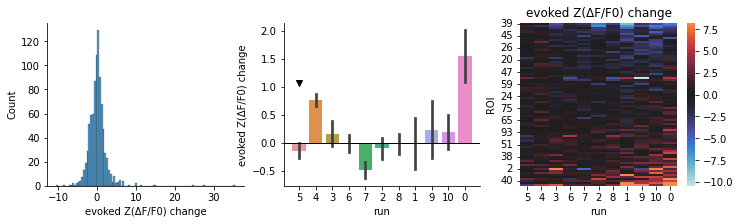

In [38]:
# Plot evoked change graphs
ykey_diff = get_change_key(ykey_plt)
figs[f'curated {ykey_diff} graphs'] = plot_stat_graphs(
    trialagg_stats, 
    ykey_diff, 
    run_order=sorted_ISPTAs, 
    irun_marker=irun_P0
)

### Identify response type for each ROI & condition using statistical tests on evoked change

 2024/08/20 13:26:43: classifying responses using directional z-score thresholding ...


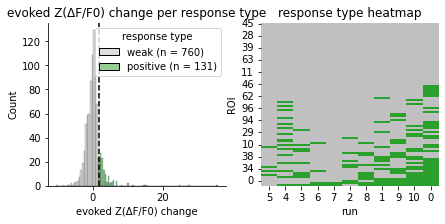

In [57]:
ykey_diff = get_change_key(ykey_classification)

# Classify responses based on z-score value
zthr = pvalue_to_zscore(PTHR_DETECTION, directional=directional)
trialagg_stats[Label.RESP_TYPE] = zscore_to_resp_type(
    trialagg_stats[ykey_diff], zthr, directional=directional)

# Count number of responses per response type
counts_per_rtype = trialagg_stats[Label.RESP_TYPE].value_counts()

# Create figure
figs['response classification'], axes = plt.subplots(1, 2, figsize=(7, 3))
for ax in axes:
    sns.despine(ax=ax)

# Plot evoked response histogram per response type
ax = axes[0]
ax.set_title(f'{ykey_diff} per response type')
sns.histplot(
    ax=ax,
    data=trialagg_stats,
    x=ykey_diff,
    bins=100,
    hue=Label.RESP_TYPE,
    hue_order=get_default_rtypes(directional=directional),
    palette=Palette.RTYPE, 
)
if not directional:
    ax.axvline(-zthr, ls='--', c='k')
ax.axvline(zthr, ls='--', c='k')
leg = ax.get_legend()
for t in leg.texts:
    s = t.get_text()
    try:
        cs = counts_per_rtype.loc[s]
    except KeyError:
        cs = 0
    t.set_text(f'{s} (n = {cs:.0f})')

# Plot response type map per ROI & run
ax = axes[1]
# Order ROIs by increasing number of positive responses (if any)
try:
    nposconds_per_ROI = (
        trialagg_stats[Label.RESP_TYPE]
        .groupby(Label.ROI)
        .value_counts()
        .unstack()['positive']
        .fillna(0.)
        .sort_values()
    )
except KeyError:
    nposconds_per_ROI = pd.Series(0., index=trialagg_stats.index.unique(Label.ROI))
ROI_order = nposconds_per_ROI.index
ax.set_title(f'{Label.RESP_TYPE} heatmap')
poscondsmap = (trialagg_stats[Label.RESP_TYPE]
    .replace(swapdict(RTYPE_MAP))
    .unstack()
    .reindex(ROI_order, axis=0)
    .reindex(sorted_ISPTAs.index.values, axis=1)
)
sns.heatmap(
    ax=ax,
    data=poscondsmap, 
    cbar=False,
    cmap=rtype_cmap,
    center=0
);

### Classify cells "responsiveness" based on their fraction of non-weak responses

 2024/08/20 13:26:45: computing fraction of response occurence per ROI over 6 "strong ISPTA" conditions...
 2024/08/20 13:26:45: classiying ROIs as a function of their response occurence fractions...
 2024/08/20 13:26:45: expanding (81 ROIs) input dataframe to match (81 ROIs x 11 runs x 15 trials) reference dataframe
 2024/08/20 13:26:45: expanding (81 ROIs) input dataframe to match (81 ROIs x 11 runs) reference dataframe
 2024/08/20 13:26:45: cell breakdown:
  - weak: 67 (82.7%)
  - positive: 14 (17.3%)


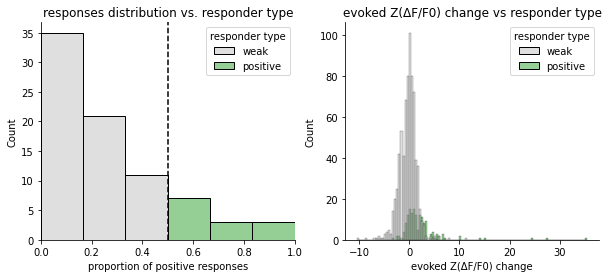

In [58]:
# Classify ROIs based on fraction of each response type across experiment
roistats, nconds_classification = classify_ROIs(
    trialagg_stats, directional=directional, return_nconds=True)

# Add roistats to stats and trial-averaged stats
vstats = free_expand_and_add(roistats, vstats.copy())
trialagg_stats = free_expand_and_add(roistats, trialagg_stats.copy())

# Assess whether weak is the only type of response
is_only_weak = len(roistats.columns) == 1 and 'weak' in roistats.columns

# Log number and percentage of cells of each responder type identified
ncells_per_type = roistats[Label.ROI_RESP_TYPE].value_counts()
ncells_tot = ncells_per_type.sum()
logstr = []
for rtype, count in ncells_per_type.items():
    logstr.append(f'  - {rtype}: {count} ({count / ncells_tot * 100:.1f}%)')
logstr = "\n".join(logstr)
logger.info(f'cell breakdown:\n{logstr}')

# Create figure
figs['responder classification'], axes = plt.subplots(1, 2, figsize=(10, 4))
for ax in axes:
    sns.despine(ax=ax)

# Plot histogram of # responses of each type per responder category
ax = axes[0]
ax.set_title(f'responses distribution vs. {Label.ROI_RESP_TYPE}')
if directional:
    ax.set_xlabel('proportion of positive responses')
    histkwargs = dict(x='positive')
else:
    ax.set_xlabel('proportion of negative responses')
    ax.set_ylabel('proportion of positive responses')
    histkwargs = dict(x='negative', y='positive')
if not is_only_weak:
    sns.histplot(
        data=roistats, 
        ax=ax, 
        binwidth=1 / nconds_classification,
        hue=Label.ROI_RESP_TYPE, 
        hue_order=get_default_rtypes(directional=directional), 
        palette=Palette.RTYPE,
        **histkwargs
    )
ax.axvline(PROP_CONDS_THR, c='k', ls='--')
ax.set_xlim(0, 1)
if not directional:
    ax.axhline(PROP_CONDS_THR, c='k', ls='--')
    ax.set_ylim(0, 1)

# Plot response strength histogram with cell classification
ax = axes[1]
ax.set_title(f'{ykey_diff} vs {Label.ROI_RESP_TYPE}')
sns.histplot(
    data=trialagg_stats, x=ykey_diff, ax=ax,
    hue=Label.ROI_RESP_TYPE, 
    hue_order=get_default_rtypes(directional=directional), 
    palette=Palette.RTYPE);

### Save processed data to disk

In [59]:
processed_dir = get_output_equivalent(
    conditioning_dir, DataRoot.CONDITIONED, f'{DataRoot.PROCESSED}/{processing_id}')
processed_fpath = os.path.join(processed_dir, os.path.basename(conditioned_fpath))
map_ops = {
    'micronsPerPixel': um_per_px,
    'Lx': s2p_ops['Lx'],
    'Ly': s2p_ops['Ly'],
    'Vcorr': s2p_ops['Vcorr'],
    'max_proj': s2p_ops['max_proj'],
}
for i, Vmap in enumerate(s2p_ops['Vmap']):
    map_ops[f'Vmap{i}'] = Vmap

save_processed_dataset(
    processed_fpath,
    trialagg_timeseries,
    popagg_timeseries,
    stats, # vstats,
    trialagg_stats,
    ROI_masks, 
    map_ops
)

 2024/08/20 13:26:48: deleting pre-existing data file...
 2024/08/20 13:26:48: saving trial-aggregated timeseries data...
 2024/08/20 13:26:48: saving population-average timeseries data...
 2024/08/20 13:26:48: saving extended stats data...
 2024/08/20 13:26:48: saving trial-aggregated stats data...
 2024/08/20 13:26:48: saving ROI masks...
 2024/08/20 13:26:48: saving mapping options...
 2024/08/20 13:26:48: all data fields saved to "/gpfs/scratch/lemait01/data/usnm/processed/aggmedian_classzscore_directional/alpha0.7_qadaptive_wq30.0s/suite2p_fs_5.0_reg_tif_tau_0.7/kd_G0.5_V0.05_npad10/submap_stim-1->stimeverytrial/channel1/30.0Hz_5.0Hz_smooth/main/cre_sst/20200302_mouse130_region1.h5"


/gpfs/data/shohamlab/theo/code/usnm2p/usnm2p/fileops.py:798: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->integer,key->axis1_level0] [items->None]

  store['stats'] = stats
/gpfs/data/shohamlab/theo/code/usnm2p/usnm2p/fileops.py:798: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->integer,key->axis1_level2] [items->None]

  store['stats'] = stats
/gpfs/data/shohamlab/theo/code/usnm2p/usnm2p/fileops.py:807: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store['map_ops'] = pd.Series(map_ops)


## Results visualization

Several key analysis outputs are visualized:
- summary of the neural populations per responder type & their spatial distribution across the field of view
- parameter-dependency of response metrics for each responder type.
- parameter-dependent aggregate traces of activity metrics (ΔF/F0 and event rate) for each  responder type

### Timelapse images for baseline run 

 2024/08/20 13:19:10: plotting frames 23 - 37 from trials 0 - 15...


100%|██████████| 16/16 [00:02<00:00,  5.96it/s]


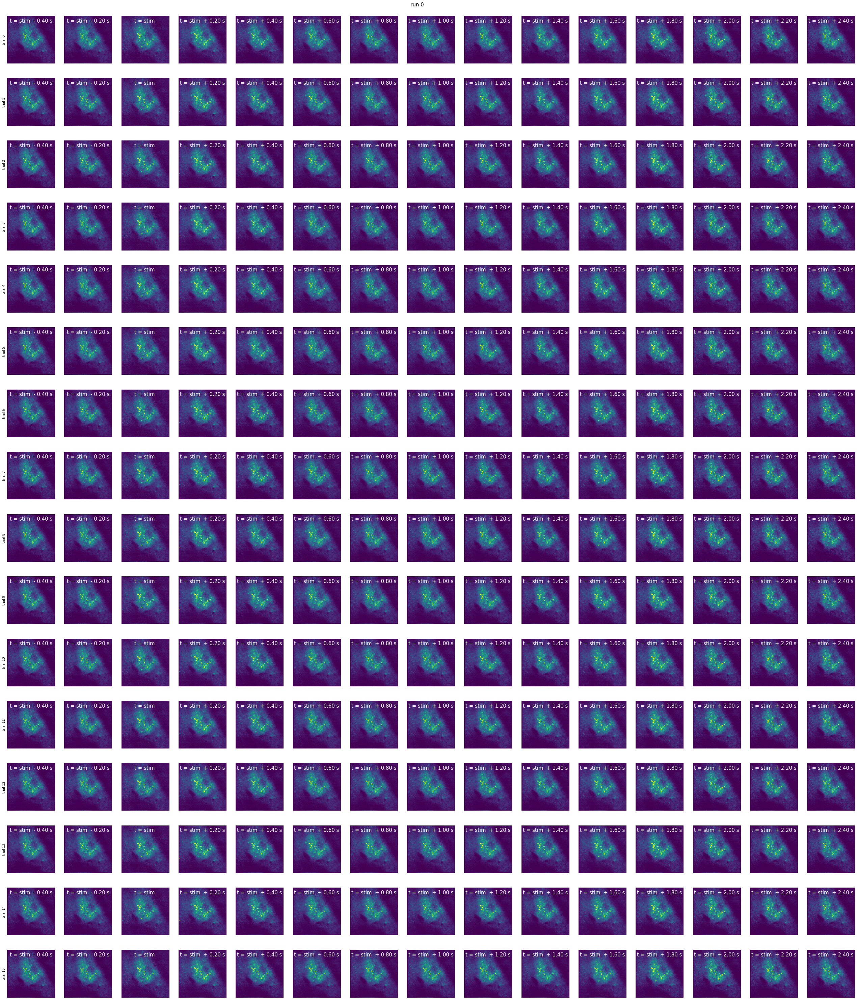

In [42]:
# Extract run index of reference condition (or fall back to first run)
try:
    irun_refcond = extract_run_index(output_info_table)
except ValueError:
    irun_refcond = 0

# Plot frames for that run - trial combination
itrial_plot = None  # extract frames from all trials
iframes = get_frames_indexes(fidx.iref, irelstart=-2, irelend=12, every=1)
figs['frames refcond'] = plot_registered_frames(
    s2p_ops, irun_refcond, itrial_plot, iframes, ntrials_per_run, nframes_per_trial, 
    fidx=fidx, fps=fps, qmin=.2, qmax=.999)

### Dataset summary

 2024/08/20 13:26:56: generating cells map color-coded by fraction of positive responses


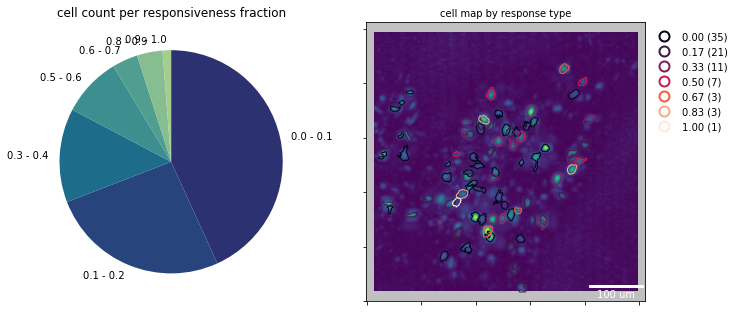

In [60]:
# Counts cells by interval of responsiveness fraction
posfracs_by_cell = trialagg_stats.groupby(Label.ROI)['positive'].first()
fracdelims = np.arange(0, 1.01, 0.1)
counts_by_posfrac = pd.Series(
    data=np.histogram(posfracs_by_cell, bins=fracdelims)[0], 
    index=[f'{lb:.1f} - {ub:.1f}' for lb, ub in zip(fracdelims[:-1], fracdelims[1:])]
)

# Create figure
figs['dataset summary'], axes = plt.subplots(1, 2, figsize=(11, 6))

# Plot counts on pie chart
ax = axes[0]
ax.set_title('cell count per responsiveness fraction')
counts_by_posfrac.plot.pie(
    ax=ax, 
    cmap='crest_r', 
    startangle=90,
    counterclock=False,
    wedgeprops={'edgecolor': None}
)
ax.set_ylabel('')

# Spatial distribution of cells per response type
plot_field_of_view(
    map_ops, ROI_masks, trialagg_stats, title='cell map by response type',
    um_per_px=um_per_px, refkey='Vcorr', mode='contour', hue='positive', ax=axes[1]);

### Save figures

In [61]:
figs = {k: v for k, v in figs.items() if v is not None}
save_figs_book(figsdir, figs, suffix=figs_suffix)

# Save stacks as GIFs if specified
if irun_inspect is not None and save_gifs:
    figs_subdir = get_figdir(figsdir)
    # raw and fileted stacks from specific run
    save_stack_to_gif(
        figs_subdir, {'raw': raw_stack_fpaths[irun_inspect], 'filtered': filtered_stack_fpaths[irun_inspect]},
        ilabels=i_stim_frames_run)
    # registered stack (slice corresponding to specific run)
    save_stack_to_gif(
        figs_subdir, s2p_ops, title=outstack_label,
        ilabels=istimframes_stacked, bounds=runbounds)

 2024/08/20 13:27:02: saving figures in /gpfs/scratch/lemait01/data/usnm/figs/2024.08.20/figs_cre_sst_20200302_mouse130_region1_0.5_alpha0.7_qadaptive_wq30.0s_aggmedian_classzscore_directional.pdf:


100%|██████████| 44/44 [00:41<00:00,  1.06it/s]


### Notify upon completion

In [45]:
# Get time stamp from notebook completion
tstamp_end = datetime.datetime.now()

# Log completion process
s = f'{dataset_id} notebook completed in {tstamp_end - tstamp_start} s'
if slack_notify:
    jupyter_slack.notify_self(s)
logger.info(s)

 2024/08/20 13:20:47: 20200302_mouse130_region1 notebook completed in 0:08:20.408447 s
